In [1]:
%matplotlib inline
import matplotlib.pyplot as plt

In [2]:
import os
import numpy as np
import astropy.units as u
from astropy.coordinates import SkyCoord, Angle
from regions import CircleSkyRegion
from gammapy.spectrum import (
    SpectrumDatasetOnOff,
    SpectrumDataset,
    SpectrumDatasetMaker,
)
from gammapy.modeling import Fit, Parameter
from gammapy.modeling.models import (
    PowerLawSpectralModel,
    SpectralModel,
    SkyModel,
    ExpCutoffPowerLawSpectralModel,
)
from gammapy.irf import load_cta_irfs
from gammapy.data import Observation
from gammapy.maps import MapAxis

In [3]:
livetime = 48 * u.h
pointing = SkyCoord(0, 0, unit="deg", frame="galactic")
offset = 0.5 * u.deg
# Reconstructed and true energy axis
energy_axis = MapAxis.from_edges(
    np.logspace(-1.5, 2.0, 10), unit="TeV", name="energy", interp="log"
)
energy_axis_true = MapAxis.from_edges(
    np.logspace(-1.5, 2.0, 31), unit="TeV", name="energy", interp="log"
)

on_region_radius = Angle("0.11 deg")
on_region = CircleSkyRegion(center=pointing, radius=on_region_radius)

In [4]:
# Define spectral model - a simple Power Law in this case
model_simu = ExpCutoffPowerLawSpectralModel(
    index=2.22,
    amplitude=1.289e-12 * u.Unit("cm-2 s-1 TeV-1"),
    reference=1 * u.TeV,
    lambda_=5 * u.Unit("TeV-1"),
    alpha = 1,
)
print(model_simu)
# we set the sky model used in the dataset
model = SkyModel(spectral_model=model_simu)

ExpCutoffPowerLawSpectralModel

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.220e+00   nan                nan nan  False
amplitude 1.289e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 5.000e+00   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True


In [5]:
os.environ['CALDB'] = '/home/rishank/anaconda2/envs/cta/share/caldb/'
!echo $CALDB
!ls $CALDB

/home/rishank/anaconda2/envs/cta/share/caldb/
data


In [6]:
# Load the IRFs
# In this simulation, we use the CTA-1DC irfs shipped with gammapy.
irfs = load_cta_irfs(
    "$CALDB/data/cta/prod3b-v2/bcf/South_z20_50h/irf_file.fits"
)

In [7]:
obs = Observation.create(pointing=pointing, livetime=livetime, irfs=irfs)
print(obs)

Info for OBS_ID = 1
- Pointing pos: RA 266.40 deg / Dec -28.94 deg
- Livetime duration: 172800.0 s



In [8]:
# Make the SpectrumDataset
dataset_empty = SpectrumDataset.create(
    e_reco=energy_axis.edges, e_true=energy_axis_true.edges, region=on_region
)
maker = SpectrumDatasetMaker(selection=["aeff", "edisp", "background"])
dataset = maker.run(dataset_empty, obs)

In [9]:
# Set the model on the dataset, and fake
dataset.model = model
dataset.fake(random_state=42)
print(dataset)

SpectrumDataset

    Name                            : 1 

    Total counts                    : 20280 
    Total predicted counts          : nan
    Total background counts         : 20309.41

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 1.73e+05 s

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : cash
    Fit statistic value (-2 log(L)) : nan

    Number of parameters            : 0
    Number of free parameters       : 0




In [10]:
dataset_onoff = SpectrumDatasetOnOff(
    aeff=dataset.aeff,
    edisp=dataset.edisp,
    models=model,
    livetime=livetime,
    acceptance=1,
    acceptance_off=5,
)
dataset_onoff.fake(background_model=dataset.background)
print(dataset_onoff)

SpectrumDatasetOnOff

    Name                            :  

    Total counts                    : 26482 
    Total predicted counts          : 26515.13
    Total off counts                : 101659.00

    Total background counts         : 20331.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 12.58

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0



In [11]:

%%time

n_obs = 10000
datasets = []

for idx in range(n_obs):
    dataset_onoff.fake(random_state=idx, background_model=dataset.background)
    dataset_onoff.name = f"obs_{idx}"
    datasets.append(dataset_onoff.copy())

CPU times: user 1min 4s, sys: 634 ms, total: 1min 4s
Wall time: 1min 26s


In [12]:
print(*datasets, sep = "\n") 

SpectrumDatasetOnOff

    Name                            : obs_0 

    Total counts                    : 26536 
    Total predicted counts          : 26596.33
    Total off counts                : 102065.00

    Total background counts         : 20413.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.09

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1 

    Total counts                    : 26375 
    Total predicted counts          : 26517.73
    Total off counts                : 101672.00

    Total background counts         : 20

SpectrumDatasetOnOff

    Name                            : obs_14 

    Total counts                    : 26795 
    Total predicted counts          : 26503.73
    Total off counts                : 101602.00

    Total background counts         : 20320.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.12

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_15 

    Total counts                    : 26414 
    Total predicted counts          : 26492.73
    Total off counts                : 101547.00

    Total background counts         : 

SpectrumDatasetOnOff

    Name                            : obs_28 

    Total counts                    : 26583 
    Total predicted counts          : 26593.33
    Total off counts                : 102050.00

    Total background counts         : 20410.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.39

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_29 

    Total counts                    : 26537 
    Total predicted counts          : 26515.13
    Total off counts                : 101659.00

    Total background counts         :

SpectrumDatasetOnOff

    Name                            : obs_49 

    Total counts                    : 26900 
    Total predicted counts          : 26518.53
    Total off counts                : 101676.00

    Total background counts         : 20335.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.51

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_50 

    Total counts                    : 26478 
    Total predicted counts          : 26609.53
    Total off counts                : 102131.00

    Total background counts         :

SpectrumDatasetOnOff

    Name                            : obs_63 

    Total counts                    : 26571 
    Total predicted counts          : 26433.53
    Total off counts                : 101251.00

    Total background counts         : 20250.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.25

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_64 

    Total counts                    : 26397 
    Total predicted counts          : 26457.53
    Total off counts                : 101371.00

    Total background counts         :

SpectrumDatasetOnOff

    Name                            : obs_85 

    Total counts                    : 26368 
    Total predicted counts          : 26463.33
    Total off counts                : 101400.00

    Total background counts         : 20280.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.07

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_86 

    Total counts                    : 26118 
    Total predicted counts          : 26378.73
    Total off counts                : 100977.00

    Total background counts         : 

SpectrumDatasetOnOff

    Name                            : obs_96 

    Total counts                    : 26522 
    Total predicted counts          : 26510.53
    Total off counts                : 101636.00

    Total background counts         : 20327.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.98

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_97 

    Total counts                    : 26504 
    Total predicted counts          : 26460.73
    Total off counts                : 101387.00

    Total background counts         : 

SpectrumDatasetOnOff

    Name                            : obs_116 

    Total counts                    : 26520 
    Total predicted counts          : 26418.93
    Total off counts                : 101178.00

    Total background counts         : 20235.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 12.19

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_117 

    Total counts                    : 26107 
    Total predicted counts          : 26507.33
    Total off counts                : 101620.00

    Total background counts        

SpectrumDatasetOnOff

    Name                            : obs_127 

    Total counts                    : 26277 
    Total predicted counts          : 26626.13
    Total off counts                : 102214.00

    Total background counts         : 20442.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.96

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_128 

    Total counts                    : 26435 
    Total predicted counts          : 26346.53
    Total off counts                : 100816.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_140 

    Total counts                    : 26506 
    Total predicted counts          : 26452.53
    Total off counts                : 101346.00

    Total background counts         : 20269.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.46

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_141 

    Total counts                    : 26450 
    Total predicted counts          : 26463.73
    Total off counts                : 101402.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_161 

    Total counts                    : 26626 
    Total predicted counts          : 26564.53
    Total off counts                : 101906.00

    Total background counts         : 20381.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.88

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_162 

    Total counts                    : 26420 
    Total predicted counts          : 26496.13
    Total off counts                : 101564.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_175 

    Total counts                    : 26702 
    Total predicted counts          : 26577.73
    Total off counts                : 101972.00

    Total background counts         : 20394.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.41

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_176 

    Total counts                    : 26652 
    Total predicted counts          : 26463.93
    Total off counts                : 101403.00

    Total background counts        

SpectrumDatasetOnOff

    Name                            : obs_191 

    Total counts                    : 26542 
    Total predicted counts          : 26435.73
    Total off counts                : 101262.00

    Total background counts         : 20252.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.79

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_192 

    Total counts                    : 26568 
    Total predicted counts          : 26578.13
    Total off counts                : 101974.00

    Total background counts         


SpectrumDatasetOnOff

    Name                            : obs_207 

    Total counts                    : 26556 
    Total predicted counts          : 26626.13
    Total off counts                : 102214.00

    Total background counts         : 20442.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.15

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_208 

    Total counts                    : 26246 
    Total predicted counts          : 26571.13
    Total off counts                : 101939.00

    Total background counts        

SpectrumDatasetOnOff

    Name                            : obs_219 

    Total counts                    : 26227 
    Total predicted counts          : 26451.53
    Total off counts                : 101341.00

    Total background counts         : 20268.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.47

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_220 

    Total counts                    : 26590 
    Total predicted counts          : 26434.93
    Total off counts                : 101258.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_230 

    Total counts                    : 26572 
    Total predicted counts          : 26443.33
    Total off counts                : 101300.00

    Total background counts         : 20260.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 1.48

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_231 

    Total counts                    : 26345 
    Total predicted counts          : 26527.33
    Total off counts                : 101720.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_242 

    Total counts                    : 26319 
    Total predicted counts          : 26410.93
    Total off counts                : 101138.00

    Total background counts         : 20227.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 14.52

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_243 

    Total counts                    : 26582 
    Total predicted counts          : 26481.73
    Total off counts                : 101492.00

    Total background counts        

SpectrumDatasetOnOff

    Name                            : obs_254 

    Total counts                    : 26308 
    Total predicted counts          : 26439.73
    Total off counts                : 101282.00

    Total background counts         : 20256.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.62

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_255 

    Total counts                    : 26503 
    Total predicted counts          : 26495.33
    Total off counts                : 101560.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_268 

    Total counts                    : 26378 
    Total predicted counts          : 26563.53
    Total off counts                : 101901.00

    Total background counts         : 20380.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.38

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_269 

    Total counts                    : 26143 
    Total predicted counts          : 26518.53
    Total off counts                : 101676.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_279 

    Total counts                    : 26601 
    Total predicted counts          : 26615.73
    Total off counts                : 102162.00

    Total background counts         : 20432.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.83

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_280 

    Total counts                    : 26610 
    Total predicted counts          : 26559.13
    Total off counts                : 101879.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_292 

    Total counts                    : 26638 
    Total predicted counts          : 26431.13
    Total off counts                : 101239.00

    Total background counts         : 20247.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.58

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_293 

    Total counts                    : 26588 
    Total predicted counts          : 26536.33
    Total off counts                : 101765.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_303 

    Total counts                    : 26622 
    Total predicted counts          : 26392.53
    Total off counts                : 101046.00

    Total background counts         : 20209.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.61

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_304 

    Total counts                    : 26597 
    Total predicted counts          : 26406.73
    Total off counts                : 101117.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_323 

    Total counts                    : 26726 
    Total predicted counts          : 26405.13
    Total off counts                : 101109.00

    Total background counts         : 20221.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.64

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_324 

    Total counts                    : 26157 
    Total predicted counts          : 26555.53
    Total off counts                : 101861.00

    Total background counts        

SpectrumDatasetOnOff

    Name                            : obs_334 

    Total counts                    : 26506 
    Total predicted counts          : 26662.33
    Total off counts                : 102395.00

    Total background counts         : 20479.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.44

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_335 

    Total counts                    : 26509 
    Total predicted counts          : 26413.33
    Total off counts                : 101150.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_348 

    Total counts                    : 26529 
    Total predicted counts          : 26606.33
    Total off counts                : 102115.00

    Total background counts         : 20423.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.29

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_349 

    Total counts                    : 26597 
    Total predicted counts          : 26481.73
    Total off counts                : 101492.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_366 

    Total counts                    : 26612 
    Total predicted counts          : 26509.93
    Total off counts                : 101633.00

    Total background counts         : 20326.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.07

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_367 

    Total counts                    : 26057 
    Total predicted counts          : 26462.73
    Total off counts                : 101397.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_378 

    Total counts                    : 26414 
    Total predicted counts          : 26543.93
    Total off counts                : 101803.00

    Total background counts         : 20360.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.13

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_379 

    Total counts                    : 26538 
    Total predicted counts          : 26501.73
    Total off counts                : 101592.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_390 

    Total counts                    : 26575 
    Total predicted counts          : 26538.13
    Total off counts                : 101774.00

    Total background counts         : 20354.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.91

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_391 

    Total counts                    : 26346 
    Total predicted counts          : 26496.73
    Total off counts                : 101567.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_404 

    Total counts                    : 26775 
    Total predicted counts          : 26427.53
    Total off counts                : 101221.00

    Total background counts         : 20244.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.09

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_405 

    Total counts                    : 26336 
    Total predicted counts          : 26505.33
    Total off counts                : 101610.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_422 

    Total counts                    : 26544 
    Total predicted counts          : 26584.33
    Total off counts                : 102005.00

    Total background counts         : 20401.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.75

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_423 

    Total counts                    : 26435 
    Total predicted counts          : 26520.93
    Total off counts                : 101688.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_441 

    Total counts                    : 26596 
    Total predicted counts          : 26548.53
    Total off counts                : 101826.00

    Total background counts         : 20365.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.24

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_442 

    Total counts                    : 26591 
    Total predicted counts          : 26440.53
    Total off counts                : 101286.00

    Total background counts         


SpectrumDatasetOnOff

    Name                            : obs_456 

    Total counts                    : 26382 
    Total predicted counts          : 26429.13
    Total off counts                : 101229.00

    Total background counts         : 20245.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.16

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_457 

    Total counts                    : 26264 
    Total predicted counts          : 26529.13
    Total off counts                : 101729.00

    Total background counts        

SpectrumDatasetOnOff

    Name                            : obs_469 

    Total counts                    : 26451 
    Total predicted counts          : 26502.93
    Total off counts                : 101598.00

    Total background counts         : 20319.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.82

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_470 

    Total counts                    : 26399 
    Total predicted counts          : 26501.73
    Total off counts                : 101592.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_480 

    Total counts                    : 26582 
    Total predicted counts          : 26463.93
    Total off counts                : 101403.00

    Total background counts         : 20280.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.36

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_481 

    Total counts                    : 26749 
    Total predicted counts          : 26456.33
    Total off counts                : 101365.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_493 

    Total counts                    : 26775 
    Total predicted counts          : 26490.93
    Total off counts                : 101538.00

    Total background counts         : 20307.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.96

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_494 

    Total counts                    : 26534 
    Total predicted counts          : 26541.93
    Total off counts                : 101793.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_505 

    Total counts                    : 26581 
    Total predicted counts          : 26507.73
    Total off counts                : 101622.00

    Total background counts         : 20324.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.90

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_506 

    Total counts                    : 26518 
    Total predicted counts          : 26522.13
    Total off counts                : 101694.00

    Total background counts        

SpectrumDatasetOnOff

    Name                            : obs_523 

    Total counts                    : 26107 
    Total predicted counts          : 26592.33
    Total off counts                : 102045.00

    Total background counts         : 20409.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 19.59

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_524 

    Total counts                    : 26563 
    Total predicted counts          : 26605.53
    Total off counts                : 102111.00

    Total background counts        

SpectrumDatasetOnOff

    Name                            : obs_546 

    Total counts                    : 26170 
    Total predicted counts          : 26508.33
    Total off counts                : 101625.00

    Total background counts         : 20325.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 13.54

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_547 

    Total counts                    : 26451 
    Total predicted counts          : 26505.93
    Total off counts                : 101613.00

    Total background counts        

SpectrumDatasetOnOff

    Name                            : obs_561 

    Total counts                    : 26586 
    Total predicted counts          : 26460.73
    Total off counts                : 101387.00

    Total background counts         : 20277.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.14

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_562 

    Total counts                    : 26375 
    Total predicted counts          : 26487.33
    Total off counts                : 101520.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_580 

    Total counts                    : 26408 
    Total predicted counts          : 26596.93
    Total off counts                : 102068.00

    Total background counts         : 20413.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 13.31

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_581 

    Total counts                    : 26492 
    Total predicted counts          : 26488.13
    Total off counts                : 101524.00

    Total background counts        

SpectrumDatasetOnOff

    Name                            : obs_596 

    Total counts                    : 26308 
    Total predicted counts          : 26426.73
    Total off counts                : 101217.00

    Total background counts         : 20243.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.28

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_597 

    Total counts                    : 26582 
    Total predicted counts          : 26547.13
    Total off counts                : 101819.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_608 

    Total counts                    : 26498 
    Total predicted counts          : 26480.73
    Total off counts                : 101487.00

    Total background counts         : 20297.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.84

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_609 

    Total counts                    : 26374 
    Total predicted counts          : 26580.33
    Total off counts                : 101985.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_619 

    Total counts                    : 26586 
    Total predicted counts          : 26527.53
    Total off counts                : 101721.00

    Total background counts         : 20344.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.70

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_620 

    Total counts                    : 26626 
    Total predicted counts          : 26568.53
    Total off counts                : 101926.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_633 

    Total counts                    : 26489 
    Total predicted counts          : 26498.33
    Total off counts                : 101575.00

    Total background counts         : 20315.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.62

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_634 

    Total counts                    : 26865 
    Total predicted counts          : 26564.93
    Total off counts                : 101908.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_645 

    Total counts                    : 26655 
    Total predicted counts          : 26523.13
    Total off counts                : 101699.00

    Total background counts         : 20339.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.91

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_646 

    Total counts                    : 26311 
    Total predicted counts          : 26467.93
    Total off counts                : 101423.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_663 

    Total counts                    : 26454 
    Total predicted counts          : 26552.73
    Total off counts                : 101847.00

    Total background counts         : 20369.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 1.20

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_664 

    Total counts                    : 26338 
    Total predicted counts          : 26431.73
    Total off counts                : 101242.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_678 

    Total counts                    : 26614 
    Total predicted counts          : 26463.33
    Total off counts                : 101400.00

    Total background counts         : 20280.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.24

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_679 

    Total counts                    : 26272 
    Total predicted counts          : 26579.13
    Total off counts                : 101979.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_690 

    Total counts                    : 26462 
    Total predicted counts          : 26559.73
    Total off counts                : 101882.00

    Total background counts         : 20376.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.16

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_691 

    Total counts                    : 26550 
    Total predicted counts          : 26511.33
    Total off counts                : 101640.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_708 

    Total counts                    : 26652 
    Total predicted counts          : 26421.93
    Total off counts                : 101193.00

    Total background counts         : 20238.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.95

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_709 

    Total counts                    : 26521 
    Total predicted counts          : 26455.33
    Total off counts                : 101360.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_719 

    Total counts                    : 26726 
    Total predicted counts          : 26550.93
    Total off counts                : 101838.00

    Total background counts         : 20367.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.23

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_720 

    Total counts                    : 26330 
    Total predicted counts          : 26413.33
    Total off counts                : 101150.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_731 

    Total counts                    : 26649 
    Total predicted counts          : 26599.93
    Total off counts                : 102083.00

    Total background counts         : 20416.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.06

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_732 

    Total counts                    : 26606 
    Total predicted counts          : 26571.73
    Total off counts                : 101942.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_742 

    Total counts                    : 26398 
    Total predicted counts          : 26559.13
    Total off counts                : 101879.00

    Total background counts         : 20375.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.05

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_743 

    Total counts                    : 26456 
    Total predicted counts          : 26505.33
    Total off counts                : 101610.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_754 

    Total counts                    : 26442 
    Total predicted counts          : 26558.93
    Total off counts                : 101878.00

    Total background counts         : 20375.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.49

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_755 

    Total counts                    : 26735 
    Total predicted counts          : 26552.93
    Total off counts                : 101848.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_765 

    Total counts                    : 26523 
    Total predicted counts          : 26479.33
    Total off counts                : 101480.00

    Total background counts         : 20296.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.93

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_766 

    Total counts                    : 26509 
    Total predicted counts          : 26590.53
    Total off counts                : 102036.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_778 

    Total counts                    : 26534 
    Total predicted counts          : 26504.53
    Total off counts                : 101606.00

    Total background counts         : 20321.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.56

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_779 

    Total counts                    : 26652 
    Total predicted counts          : 26508.93
    Total off counts                : 101628.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_789 

    Total counts                    : 26610 
    Total predicted counts          : 26590.33
    Total off counts                : 102035.00

    Total background counts         : 20407.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.09

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_790 

    Total counts                    : 26626 
    Total predicted counts          : 26448.13
    Total off counts                : 101324.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_800 

    Total counts                    : 26411 
    Total predicted counts          : 26531.73
    Total off counts                : 101742.00

    Total background counts         : 20348.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.55

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_801 

    Total counts                    : 26192 
    Total predicted counts          : 26542.73
    Total off counts                : 101797.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_811 

    Total counts                    : 26612 
    Total predicted counts          : 26505.93
    Total off counts                : 101613.00

    Total background counts         : 20322.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.23

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_812 

    Total counts                    : 26575 
    Total predicted counts          : 26538.33
    Total off counts                : 101775.00

    Total background counts        

SpectrumDatasetOnOff

    Name                            : obs_824 

    Total counts                    : 26615 
    Total predicted counts          : 26444.93
    Total off counts                : 101308.00

    Total background counts         : 20261.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.86

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_825 

    Total counts                    : 26716 
    Total predicted counts          : 26394.73
    Total off counts                : 101057.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_835 

    Total counts                    : 26529 
    Total predicted counts          : 26453.93
    Total off counts                : 101353.00

    Total background counts         : 20270.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 12.45

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_836 

    Total counts                    : 26797 
    Total predicted counts          : 26540.33
    Total off counts                : 101785.00

    Total background counts        

SpectrumDatasetOnOff

    Name                            : obs_846 

    Total counts                    : 26355 
    Total predicted counts          : 26327.93
    Total off counts                : 100723.00

    Total background counts         : 20144.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.76

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_847 

    Total counts                    : 26532 
    Total predicted counts          : 26488.33
    Total off counts                : 101525.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_859 

    Total counts                    : 26320 
    Total predicted counts          : 26457.13
    Total off counts                : 101369.00

    Total background counts         : 20273.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.75

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_860 

    Total counts                    : 26450 
    Total predicted counts          : 26485.33
    Total off counts                : 101510.00

    Total background counts        

SpectrumDatasetOnOff

    Name                            : obs_874 

    Total counts                    : 26496 
    Total predicted counts          : 26454.33
    Total off counts                : 101355.00

    Total background counts         : 20271.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.02

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_875 

    Total counts                    : 26508 
    Total predicted counts          : 26591.13
    Total off counts                : 102039.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_887 

    Total counts                    : 26348 
    Total predicted counts          : 26501.13
    Total off counts                : 101589.00

    Total background counts         : 20317.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.96

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_888 

    Total counts                    : 26370 
    Total predicted counts          : 26455.53
    Total off counts                : 101361.00

    Total background counts        

SpectrumDatasetOnOff

    Name                            : obs_902 

    Total counts                    : 26546 
    Total predicted counts          : 26535.73
    Total off counts                : 101762.00

    Total background counts         : 20352.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.34

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_903 

    Total counts                    : 26176 
    Total predicted counts          : 26544.33
    Total off counts                : 101805.00

    Total background counts        

SpectrumDatasetOnOff

    Name                            : obs_916 

    Total counts                    : 26651 
    Total predicted counts          : 26570.53
    Total off counts                : 101936.00

    Total background counts         : 20387.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.14

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_917 

    Total counts                    : 26657 
    Total predicted counts          : 26411.33
    Total off counts                : 101140.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_929 

    Total counts                    : 26431 
    Total predicted counts          : 26467.93
    Total off counts                : 101423.00

    Total background counts         : 20284.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 13.78

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_930 

    Total counts                    : 26701 
    Total predicted counts          : 26643.73
    Total off counts                : 102302.00

    Total background counts        

SpectrumDatasetOnOff

    Name                            : obs_940 

    Total counts                    : 26290 
    Total predicted counts          : 26563.73
    Total off counts                : 101902.00

    Total background counts         : 20380.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.09

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_941 

    Total counts                    : 26570 
    Total predicted counts          : 26435.13
    Total off counts                : 101259.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_954 

    Total counts                    : 26423 
    Total predicted counts          : 26425.13
    Total off counts                : 101209.00

    Total background counts         : 20241.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.41

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_955 

    Total counts                    : 26415 
    Total predicted counts          : 26529.73
    Total off counts                : 101732.00

    Total background counts        

SpectrumDatasetOnOff

    Name                            : obs_965 

    Total counts                    : 26717 
    Total predicted counts          : 26525.73
    Total off counts                : 101712.00

    Total background counts         : 20342.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.64

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_966 

    Total counts                    : 26529 
    Total predicted counts          : 26487.13
    Total off counts                : 101519.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_983 

    Total counts                    : 26451 
    Total predicted counts          : 26518.33
    Total off counts                : 101675.00

    Total background counts         : 20335.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.62

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_984 

    Total counts                    : 26177 
    Total predicted counts          : 26399.73
    Total off counts                : 101082.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_995 

    Total counts                    : 26420 
    Total predicted counts          : 26510.93
    Total off counts                : 101638.00

    Total background counts         : 20327.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.18

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_996 

    Total counts                    : 26670 
    Total predicted counts          : 26542.33
    Total off counts                : 101795.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_1007 

    Total counts                    : 26668 
    Total predicted counts          : 26522.13
    Total off counts                : 101694.00

    Total background counts         : 20338.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.04

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1008 

    Total counts                    : 26574 
    Total predicted counts          : 26545.33
    Total off counts                : 101810.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1019 

    Total counts                    : 26576 
    Total predicted counts          : 26456.33
    Total off counts                : 101365.00

    Total background counts         : 20273.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.53

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1020 

    Total counts                    : 26798 
    Total predicted counts          : 26466.53
    Total off counts                : 101416.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1030 

    Total counts                    : 26644 
    Total predicted counts          : 26446.13
    Total off counts                : 101314.00

    Total background counts         : 20262.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 13.67

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1031 

    Total counts                    : 26260 
    Total predicted counts          : 26434.13
    Total off counts                : 101254.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_1052 

    Total counts                    : 26689 
    Total predicted counts          : 26503.33
    Total off counts                : 101600.00

    Total background counts         : 20320.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.89

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1053 

    Total counts                    : 26294 
    Total predicted counts          : 26501.33
    Total off counts                : 101590.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1063 

    Total counts                    : 26334 
    Total predicted counts          : 26544.13
    Total off counts                : 101804.00

    Total background counts         : 20360.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.64

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1064 

    Total counts                    : 26447 
    Total predicted counts          : 26373.53
    Total off counts                : 100951.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_1081 

    Total counts                    : 26820 
    Total predicted counts          : 26547.93
    Total off counts                : 101823.00

    Total background counts         : 20364.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.94

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1082 

    Total counts                    : 26817 
    Total predicted counts          : 26380.13
    Total off counts                : 100984.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1093 

    Total counts                    : 26564 
    Total predicted counts          : 26473.53
    Total off counts                : 101451.00

    Total background counts         : 20290.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.21

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1094 

    Total counts                    : 26642 
    Total predicted counts          : 26376.13
    Total off counts                : 100964.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1105 

    Total counts                    : 26318 
    Total predicted counts          : 26296.13
    Total off counts                : 100564.00

    Total background counts         : 20112.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.83

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1106 

    Total counts                    : 26832 
    Total predicted counts          : 26527.13
    Total off counts                : 101719.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1118 

    Total counts                    : 26175 
    Total predicted counts          : 26567.93
    Total off counts                : 101923.00

    Total background counts         : 20384.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.73

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1119 

    Total counts                    : 26397 
    Total predicted counts          : 26472.33
    Total off counts                : 101445.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1138 

    Total counts                    : 26744 
    Total predicted counts          : 26501.33
    Total off counts                : 101590.00

    Total background counts         : 20318.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 18.63

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1139 

    Total counts                    : 26409 
    Total predicted counts          : 26523.13
    Total off counts                : 101699.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_1153 

    Total counts                    : 26504 
    Total predicted counts          : 26596.33
    Total off counts                : 102065.00

    Total background counts         : 20413.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.77

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1154 

    Total counts                    : 26412 
    Total predicted counts          : 26526.93
    Total off counts                : 101718.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1164 

    Total counts                    : 26420 
    Total predicted counts          : 26568.53
    Total off counts                : 101926.00

    Total background counts         : 20385.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.94

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1165 

    Total counts                    : 26467 
    Total predicted counts          : 26474.73
    Total off counts                : 101457.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1182 

    Total counts                    : 26561 
    Total predicted counts          : 26477.33
    Total off counts                : 101470.00

    Total background counts         : 20294.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.68

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1183 

    Total counts                    : 26517 
    Total predicted counts          : 26526.33
    Total off counts                : 101715.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1194 

    Total counts                    : 26557 
    Total predicted counts          : 26588.13
    Total off counts                : 102024.00

    Total background counts         : 20404.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.35

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1195 

    Total counts                    : 26634 
    Total predicted counts          : 26471.33
    Total off counts                : 101440.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_1207 

    Total counts                    : 26371 
    Total predicted counts          : 26425.33
    Total off counts                : 101210.00

    Total background counts         : 20242.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.07

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1208 

    Total counts                    : 26545 
    Total predicted counts          : 26507.93
    Total off counts                : 101623.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1222 

    Total counts                    : 26328 
    Total predicted counts          : 26580.33
    Total off counts                : 101985.00

    Total background counts         : 20397.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.86

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1223 

    Total counts                    : 26511 
    Total predicted counts          : 26543.73
    Total off counts                : 101802.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1236 

    Total counts                    : 26451 
    Total predicted counts          : 26527.93
    Total off counts                : 101723.00

    Total background counts         : 20344.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 1.43

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1237 

    Total counts                    : 26694 
    Total predicted counts          : 26547.13
    Total off counts                : 101819.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1248 

    Total counts                    : 26398 
    Total predicted counts          : 26613.33
    Total off counts                : 102150.00

    Total background counts         : 20430.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.90

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1249 

    Total counts                    : 26317 
    Total predicted counts          : 26401.73
    Total off counts                : 101092.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1259 

    Total counts                    : 26763 
    Total predicted counts          : 26416.13
    Total off counts                : 101164.00

    Total background counts         : 20232.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.10

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1260 

    Total counts                    : 26446 
    Total predicted counts          : 26455.73
    Total off counts                : 101362.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1277 

    Total counts                    : 26384 
    Total predicted counts          : 26552.13
    Total off counts                : 101844.00

    Total background counts         : 20368.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.02

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1278 

    Total counts                    : 26526 
    Total predicted counts          : 26476.53
    Total off counts                : 101466.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1289 

    Total counts                    : 26546 
    Total predicted counts          : 26594.73
    Total off counts                : 102057.00

    Total background counts         : 20411.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.29

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1290 

    Total counts                    : 26292 
    Total predicted counts          : 26490.73
    Total off counts                : 101537.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1302 

    Total counts                    : 26581 
    Total predicted counts          : 26475.33
    Total off counts                : 101460.00

    Total background counts         : 20292.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.53

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1303 

    Total counts                    : 26774 
    Total predicted counts          : 26516.13
    Total off counts                : 101664.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1316 

    Total counts                    : 26226 
    Total predicted counts          : 26513.13
    Total off counts                : 101649.00

    Total background counts         : 20329.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.11

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1317 

    Total counts                    : 26743 
    Total predicted counts          : 26545.33
    Total off counts                : 101810.00

    Total background counts       


SpectrumDatasetOnOff

    Name                            : obs_1330 

    Total counts                    : 26453 
    Total predicted counts          : 26450.33
    Total off counts                : 101335.00

    Total background counts         : 20267.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.07

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1331 

    Total counts                    : 26836 
    Total predicted counts          : 26504.13
    Total off counts                : 101604.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_1348 

    Total counts                    : 26486 
    Total predicted counts          : 26519.53
    Total off counts                : 101681.00

    Total background counts         : 20336.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.63

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1349 

    Total counts                    : 26690 
    Total predicted counts          : 26578.73
    Total off counts                : 101977.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1371 

    Total counts                    : 26561 
    Total predicted counts          : 26467.33
    Total off counts                : 101420.00

    Total background counts         : 20284.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.79

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1372 

    Total counts                    : 26742 
    Total predicted counts          : 26445.73
    Total off counts                : 101312.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1384 

    Total counts                    : 26593 
    Total predicted counts          : 26563.73
    Total off counts                : 101902.00

    Total background counts         : 20380.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.51

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1385 

    Total counts                    : 26541 
    Total predicted counts          : 26505.13
    Total off counts                : 101609.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1395 

    Total counts                    : 26587 
    Total predicted counts          : 26523.53
    Total off counts                : 101701.00

    Total background counts         : 20340.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.68

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1396 

    Total counts                    : 26305 
    Total predicted counts          : 26556.13
    Total off counts                : 101864.00

    Total background counts       


SpectrumDatasetOnOff

    Name                            : obs_1406 

    Total counts                    : 26590 
    Total predicted counts          : 26407.73
    Total off counts                : 101122.00

    Total background counts         : 20224.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.55

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1407 

    Total counts                    : 26128 
    Total predicted counts          : 26520.73
    Total off counts                : 101687.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_1420 

    Total counts                    : 26748 
    Total predicted counts          : 26480.13
    Total off counts                : 101484.00

    Total background counts         : 20296.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.47

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1421 

    Total counts                    : 26550 
    Total predicted counts          : 26514.13
    Total off counts                : 101654.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1431 

    Total counts                    : 26525 
    Total predicted counts          : 26509.53
    Total off counts                : 101631.00

    Total background counts         : 20326.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.62

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1432 

    Total counts                    : 26512 
    Total predicted counts          : 26512.13
    Total off counts                : 101644.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1442 

    Total counts                    : 26661 
    Total predicted counts          : 26444.13
    Total off counts                : 101304.00

    Total background counts         : 20260.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.11

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1443 

    Total counts                    : 26502 
    Total predicted counts          : 26519.73
    Total off counts                : 101682.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1453 

    Total counts                    : 26561 
    Total predicted counts          : 26505.33
    Total off counts                : 101610.00

    Total background counts         : 20322.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.56

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1454 

    Total counts                    : 26609 
    Total predicted counts          : 26452.13
    Total off counts                : 101344.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1466 

    Total counts                    : 26431 
    Total predicted counts          : 26426.33
    Total off counts                : 101215.00

    Total background counts         : 20243.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.92

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1467 

    Total counts                    : 26244 
    Total predicted counts          : 26447.13
    Total off counts                : 101319.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1479 

    Total counts                    : 26190 
    Total predicted counts          : 26570.73
    Total off counts                : 101937.00

    Total background counts         : 20387.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 15.76

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1480 

    Total counts                    : 26474 
    Total predicted counts          : 26381.93
    Total off counts                : 100993.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_1491 

    Total counts                    : 26459 
    Total predicted counts          : 26395.93
    Total off counts                : 101063.00

    Total background counts         : 20212.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.08

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1492 

    Total counts                    : 26564 
    Total predicted counts          : 26509.13
    Total off counts                : 101629.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1507 

    Total counts                    : 26226 
    Total predicted counts          : 26381.73
    Total off counts                : 100992.00

    Total background counts         : 20198.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.05

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1508 

    Total counts                    : 26464 
    Total predicted counts          : 26527.93
    Total off counts                : 101723.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1518 

    Total counts                    : 26659 
    Total predicted counts          : 26533.73
    Total off counts                : 101752.00

    Total background counts         : 20350.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.95

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1519 

    Total counts                    : 26306 
    Total predicted counts          : 26534.93
    Total off counts                : 101758.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_1531 

    Total counts                    : 26327 
    Total predicted counts          : 26446.73
    Total off counts                : 101317.00

    Total background counts         : 20263.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.63

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1532 

    Total counts                    : 26612 
    Total predicted counts          : 26543.73
    Total off counts                : 101802.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_1546 

    Total counts                    : 26394 
    Total predicted counts          : 26473.13
    Total off counts                : 101449.00

    Total background counts         : 20289.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.13

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1547 

    Total counts                    : 26425 
    Total predicted counts          : 26455.73
    Total off counts                : 101362.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1566 

    Total counts                    : 26674 
    Total predicted counts          : 26508.33
    Total off counts                : 101625.00

    Total background counts         : 20325.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.62

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1567 

    Total counts                    : 26335 
    Total predicted counts          : 26590.93
    Total off counts                : 102038.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1589 

    Total counts                    : 26825 
    Total predicted counts          : 26553.33
    Total off counts                : 101850.00

    Total background counts         : 20370.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.07

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1590 

    Total counts                    : 26416 
    Total predicted counts          : 26400.53
    Total off counts                : 101086.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_1600 

    Total counts                    : 26591 
    Total predicted counts          : 26460.53
    Total off counts                : 101386.00

    Total background counts         : 20277.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.67

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1601 

    Total counts                    : 26455 
    Total predicted counts          : 26614.73
    Total off counts                : 102157.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1615 

    Total counts                    : 26573 
    Total predicted counts          : 26580.73
    Total off counts                : 101987.00

    Total background counts         : 20397.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.46

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1616 

    Total counts                    : 26409 
    Total predicted counts          : 26466.93
    Total off counts                : 101418.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1627 

    Total counts                    : 26424 
    Total predicted counts          : 26535.93
    Total off counts                : 101763.00

    Total background counts         : 20352.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.49

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1628 

    Total counts                    : 26608 
    Total predicted counts          : 26551.93
    Total off counts                : 101843.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1643 

    Total counts                    : 26666 
    Total predicted counts          : 26570.73
    Total off counts                : 101937.00

    Total background counts         : 20387.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.03

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1644 

    Total counts                    : 26265 
    Total predicted counts          : 26500.53
    Total off counts                : 101586.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_1665 

    Total counts                    : 26489 
    Total predicted counts          : 26517.33
    Total off counts                : 101670.00

    Total background counts         : 20334.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.52

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1666 

    Total counts                    : 26667 
    Total predicted counts          : 26529.73
    Total off counts                : 101732.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_1676 

    Total counts                    : 26911 
    Total predicted counts          : 26488.73
    Total off counts                : 101527.00

    Total background counts         : 20305.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.37

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1677 

    Total counts                    : 26514 
    Total predicted counts          : 26492.33
    Total off counts                : 101545.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1690 

    Total counts                    : 26634 
    Total predicted counts          : 26438.73
    Total off counts                : 101277.00

    Total background counts         : 20255.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 12.13

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1691 

    Total counts                    : 26457 
    Total predicted counts          : 26385.53
    Total off counts                : 101011.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_1704 

    Total counts                    : 26277 
    Total predicted counts          : 26550.73
    Total off counts                : 101837.00

    Total background counts         : 20367.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.23

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1705 

    Total counts                    : 26214 
    Total predicted counts          : 26538.93
    Total off counts                : 101778.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1718 

    Total counts                    : 26685 
    Total predicted counts          : 26537.53
    Total off counts                : 101771.00

    Total background counts         : 20354.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.60

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1719 

    Total counts                    : 26203 
    Total predicted counts          : 26578.33
    Total off counts                : 101975.00

    Total background counts       


SpectrumDatasetOnOff

    Name                            : obs_1731 

    Total counts                    : 26648 
    Total predicted counts          : 26481.33
    Total off counts                : 101490.00

    Total background counts         : 20298.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.55

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1732 

    Total counts                    : 26354 
    Total predicted counts          : 26419.73
    Total off counts                : 101182.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_1756 

    Total counts                    : 26362 
    Total predicted counts          : 26438.33
    Total off counts                : 101275.00

    Total background counts         : 20255.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.65

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1757 

    Total counts                    : 26553 
    Total predicted counts          : 26491.33
    Total off counts                : 101540.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1769 

    Total counts                    : 26300 
    Total predicted counts          : 26524.13
    Total off counts                : 101704.00

    Total background counts         : 20340.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.00

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1770 

    Total counts                    : 26224 
    Total predicted counts          : 26525.13
    Total off counts                : 101709.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1793 

    Total counts                    : 26577 
    Total predicted counts          : 26571.33
    Total off counts                : 101940.00

    Total background counts         : 20388.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 1.99

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1794 

    Total counts                    : 26764 
    Total predicted counts          : 26586.53
    Total off counts                : 102016.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1809 

    Total counts                    : 26706 
    Total predicted counts          : 26324.33
    Total off counts                : 100705.00

    Total background counts         : 20141.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.45

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1810 

    Total counts                    : 26413 
    Total predicted counts          : 26536.53
    Total off counts                : 101766.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1827 

    Total counts                    : 26314 
    Total predicted counts          : 26528.53
    Total off counts                : 101726.00

    Total background counts         : 20345.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.39

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1828 

    Total counts                    : 26404 
    Total predicted counts          : 26453.33
    Total off counts                : 101350.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1844 

    Total counts                    : 26439 
    Total predicted counts          : 26310.13
    Total off counts                : 100634.00

    Total background counts         : 20126.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.97

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1845 

    Total counts                    : 26282 
    Total predicted counts          : 26531.53
    Total off counts                : 101741.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1855 

    Total counts                    : 26207 
    Total predicted counts          : 26554.93
    Total off counts                : 101858.00

    Total background counts         : 20371.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.46

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1856 

    Total counts                    : 26430 
    Total predicted counts          : 26495.93
    Total off counts                : 101563.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1870 

    Total counts                    : 26588 
    Total predicted counts          : 26619.13
    Total off counts                : 102179.00

    Total background counts         : 20435.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.80

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1871 

    Total counts                    : 26540 
    Total predicted counts          : 26492.53
    Total off counts                : 101546.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1891 

    Total counts                    : 26562 
    Total predicted counts          : 26469.93
    Total off counts                : 101433.00

    Total background counts         : 20286.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.91

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1892 

    Total counts                    : 26477 
    Total predicted counts          : 26501.73
    Total off counts                : 101592.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1906 

    Total counts                    : 26452 
    Total predicted counts          : 26452.53
    Total off counts                : 101346.00

    Total background counts         : 20269.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 1.50

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1907 

    Total counts                    : 26516 
    Total predicted counts          : 26418.53
    Total off counts                : 101176.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1920 

    Total counts                    : 26441 
    Total predicted counts          : 26468.53
    Total off counts                : 101426.00

    Total background counts         : 20285.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.15

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1921 

    Total counts                    : 26474 
    Total predicted counts          : 26437.13
    Total off counts                : 101269.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1935 

    Total counts                    : 26585 
    Total predicted counts          : 26461.73
    Total off counts                : 101392.00

    Total background counts         : 20278.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.44

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1936 

    Total counts                    : 26543 
    Total predicted counts          : 26604.73
    Total off counts                : 102107.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1948 

    Total counts                    : 26321 
    Total predicted counts          : 26450.73
    Total off counts                : 101337.00

    Total background counts         : 20267.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.48

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1949 

    Total counts                    : 26242 
    Total predicted counts          : 26460.33
    Total off counts                : 101385.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1971 

    Total counts                    : 26362 
    Total predicted counts          : 26472.73
    Total off counts                : 101447.00

    Total background counts         : 20289.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.85

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1972 

    Total counts                    : 26186 
    Total predicted counts          : 26561.33
    Total off counts                : 101890.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1983 

    Total counts                    : 26445 
    Total predicted counts          : 26543.93
    Total off counts                : 101803.00

    Total background counts         : 20360.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.68

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1984 

    Total counts                    : 26266 
    Total predicted counts          : 26367.93
    Total off counts                : 100923.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1995 

    Total counts                    : 26401 
    Total predicted counts          : 26575.53
    Total off counts                : 101961.00

    Total background counts         : 20392.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.00

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1996 

    Total counts                    : 26349 
    Total predicted counts          : 26391.73
    Total off counts                : 101042.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2008 

    Total counts                    : 26419 
    Total predicted counts          : 26574.33
    Total off counts                : 101955.00

    Total background counts         : 20391.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.89

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2009 

    Total counts                    : 26325 
    Total predicted counts          : 26497.73
    Total off counts                : 101572.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2027 

    Total counts                    : 26671 
    Total predicted counts          : 26371.53
    Total off counts                : 100941.00

    Total background counts         : 20188.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 17.50

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2028 

    Total counts                    : 26371 
    Total predicted counts          : 26556.93
    Total off counts                : 101868.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_2046 

    Total counts                    : 26493 
    Total predicted counts          : 26468.33
    Total off counts                : 101425.00

    Total background counts         : 20285.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.87

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2047 

    Total counts                    : 26845 
    Total predicted counts          : 26519.13
    Total off counts                : 101679.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2064 

    Total counts                    : 26298 
    Total predicted counts          : 26484.33
    Total off counts                : 101505.00

    Total background counts         : 20301.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.17

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2065 

    Total counts                    : 26573 
    Total predicted counts          : 26485.73
    Total off counts                : 101512.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2078 

    Total counts                    : 26618 
    Total predicted counts          : 26426.33
    Total off counts                : 101215.00

    Total background counts         : 20243.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.01

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2079 

    Total counts                    : 26293 
    Total predicted counts          : 26438.13
    Total off counts                : 101274.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2092 

    Total counts                    : 26399 
    Total predicted counts          : 26606.53
    Total off counts                : 102116.00

    Total background counts         : 20423.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.78

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2093 

    Total counts                    : 26452 
    Total predicted counts          : 26522.33
    Total off counts                : 101695.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2111 

    Total counts                    : 26509 
    Total predicted counts          : 26511.53
    Total off counts                : 101641.00

    Total background counts         : 20328.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.16

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2112 

    Total counts                    : 26396 
    Total predicted counts          : 26596.73
    Total off counts                : 102067.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2124 

    Total counts                    : 26460 
    Total predicted counts          : 26491.13
    Total off counts                : 101539.00

    Total background counts         : 20307.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.67

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2125 

    Total counts                    : 26503 
    Total predicted counts          : 26447.53
    Total off counts                : 101321.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2139 

    Total counts                    : 26684 
    Total predicted counts          : 26395.33
    Total off counts                : 101060.00

    Total background counts         : 20212.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 19.82

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2140 

    Total counts                    : 26768 
    Total predicted counts          : 26489.33
    Total off counts                : 101530.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_2153 

    Total counts                    : 26420 
    Total predicted counts          : 26379.93
    Total off counts                : 100983.00

    Total background counts         : 20196.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.77

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2154 

    Total counts                    : 26376 
    Total predicted counts          : 26580.53
    Total off counts                : 101986.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2173 

    Total counts                    : 26161 
    Total predicted counts          : 26498.93
    Total off counts                : 101578.00

    Total background counts         : 20315.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.23

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2174 

    Total counts                    : 26558 
    Total predicted counts          : 26450.33
    Total off counts                : 101335.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_2197 

    Total counts                    : 26728 
    Total predicted counts          : 26541.73
    Total off counts                : 101792.00

    Total background counts         : 20358.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.42

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2198 

    Total counts                    : 26492 
    Total predicted counts          : 26432.53
    Total off counts                : 101246.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2212 

    Total counts                    : 26472 
    Total predicted counts          : 26466.93
    Total off counts                : 101418.00

    Total background counts         : 20283.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.35

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2213 

    Total counts                    : 26374 
    Total predicted counts          : 26393.93
    Total off counts                : 101053.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2223 

    Total counts                    : 26236 
    Total predicted counts          : 26470.73
    Total off counts                : 101437.00

    Total background counts         : 20287.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 15.71

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2224 

    Total counts                    : 26423 
    Total predicted counts          : 26591.73
    Total off counts                : 102042.00

    Total background counts      


SpectrumDatasetOnOff

    Name                            : obs_2237 

    Total counts                    : 26535 
    Total predicted counts          : 26488.13
    Total off counts                : 101524.00

    Total background counts         : 20304.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.98

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2238 

    Total counts                    : 26403 
    Total predicted counts          : 26456.73
    Total off counts                : 101367.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_2248 

    Total counts                    : 26503 
    Total predicted counts          : 26578.93
    Total off counts                : 101978.00

    Total background counts         : 20395.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.15

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2249 

    Total counts                    : 26411 
    Total predicted counts          : 26408.33
    Total off counts                : 101125.00

    Total background counts       


SpectrumDatasetOnOff

    Name                            : obs_2259 

    Total counts                    : 26521 
    Total predicted counts          : 26501.53
    Total off counts                : 101591.00

    Total background counts         : 20318.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.74

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2260 

    Total counts                    : 26529 
    Total predicted counts          : 26500.33
    Total off counts                : 101585.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_2280 

    Total counts                    : 26480 
    Total predicted counts          : 26488.73
    Total off counts                : 101527.00

    Total background counts         : 20305.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.21

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2281 

    Total counts                    : 26479 
    Total predicted counts          : 26532.53
    Total off counts                : 101746.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2295 

    Total counts                    : 26590 
    Total predicted counts          : 26454.73
    Total off counts                : 101357.00

    Total background counts         : 20271.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.87

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2296 

    Total counts                    : 26283 
    Total predicted counts          : 26544.33
    Total off counts                : 101805.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2310 

    Total counts                    : 26416 
    Total predicted counts          : 26534.73
    Total off counts                : 101757.00

    Total background counts         : 20351.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.13

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2311 

    Total counts                    : 26451 
    Total predicted counts          : 26564.53
    Total off counts                : 101906.00

    Total background counts       


SpectrumDatasetOnOff

    Name                            : obs_2324 

    Total counts                    : 26343 
    Total predicted counts          : 26499.73
    Total off counts                : 101582.00

    Total background counts         : 20316.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.10

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2325 

    Total counts                    : 26304 
    Total predicted counts          : 26499.33
    Total off counts                : 101580.00

    Total background counts      


SpectrumDatasetOnOff

    Name                            : obs_2336 

    Total counts                    : 26630 
    Total predicted counts          : 26486.73
    Total off counts                : 101517.00

    Total background counts         : 20303.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.45

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2337 

    Total counts                    : 26339 
    Total predicted counts          : 26482.13
    Total off counts                : 101494.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_2347 

    Total counts                    : 26405 
    Total predicted counts          : 26442.73
    Total off counts                : 101297.00

    Total background counts         : 20259.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.36

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2348 

    Total counts                    : 26174 
    Total predicted counts          : 26455.73
    Total off counts                : 101362.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2359 

    Total counts                    : 26176 
    Total predicted counts          : 26430.13
    Total off counts                : 101234.00

    Total background counts         : 20246.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.69

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2360 

    Total counts                    : 26419 
    Total predicted counts          : 26399.53
    Total off counts                : 101081.00

    Total background counts       


SpectrumDatasetOnOff

    Name                            : obs_2372 

    Total counts                    : 26334 
    Total predicted counts          : 26577.93
    Total off counts                : 101973.00

    Total background counts         : 20394.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 15.20

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2373 

    Total counts                    : 26409 
    Total predicted counts          : 26515.33
    Total off counts                : 101660.00

    Total background counts     

SpectrumDatasetOnOff

    Name                            : obs_2383 

    Total counts                    : 26339 
    Total predicted counts          : 26468.93
    Total off counts                : 101428.00

    Total background counts         : 20285.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.53

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2384 

    Total counts                    : 26478 
    Total predicted counts          : 26597.13
    Total off counts                : 102069.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2403 

    Total counts                    : 26394 
    Total predicted counts          : 26482.13
    Total off counts                : 101494.00

    Total background counts         : 20298.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.13

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2404 

    Total counts                    : 26705 
    Total predicted counts          : 26432.73
    Total off counts                : 101247.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2423 

    Total counts                    : 26576 
    Total predicted counts          : 26494.53
    Total off counts                : 101556.00

    Total background counts         : 20311.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.48

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2424 

    Total counts                    : 26683 
    Total predicted counts          : 26451.33
    Total off counts                : 101340.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2437 

    Total counts                    : 26573 
    Total predicted counts          : 26510.33
    Total off counts                : 101635.00

    Total background counts         : 20327.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 15.25

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2438 

    Total counts                    : 26539 
    Total predicted counts          : 26465.53
    Total off counts                : 101411.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_2450 

    Total counts                    : 26363 
    Total predicted counts          : 26460.33
    Total off counts                : 101385.00

    Total background counts         : 20277.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.13

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2451 

    Total counts                    : 26441 
    Total predicted counts          : 26544.13
    Total off counts                : 101804.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2468 

    Total counts                    : 26466 
    Total predicted counts          : 26507.73
    Total off counts                : 101622.00

    Total background counts         : 20324.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.75

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2469 

    Total counts                    : 26511 
    Total predicted counts          : 26358.93
    Total off counts                : 100878.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2488 

    Total counts                    : 26273 
    Total predicted counts          : 26493.93
    Total off counts                : 101553.00

    Total background counts         : 20310.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.42

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2489 

    Total counts                    : 26613 
    Total predicted counts          : 26397.33
    Total off counts                : 101070.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_2510 

    Total counts                    : 26643 
    Total predicted counts          : 26415.33
    Total off counts                : 101160.00

    Total background counts         : 20232.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.23

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2511 

    Total counts                    : 26590 
    Total predicted counts          : 26539.53
    Total off counts                : 101781.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2529 

    Total counts                    : 26474 
    Total predicted counts          : 26486.13
    Total off counts                : 101514.00

    Total background counts         : 20302.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.39

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2530 

    Total counts                    : 26338 
    Total predicted counts          : 26547.13
    Total off counts                : 101819.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_2544 

    Total counts                    : 26446 
    Total predicted counts          : 26529.73
    Total off counts                : 101732.00

    Total background counts         : 20346.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.60

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2545 

    Total counts                    : 26514 
    Total predicted counts          : 26499.13
    Total off counts                : 101579.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2558 

    Total counts                    : 26726 
    Total predicted counts          : 26589.13
    Total off counts                : 102029.00

    Total background counts         : 20405.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.24

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2559 

    Total counts                    : 26364 
    Total predicted counts          : 26697.93
    Total off counts                : 102573.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2569 

    Total counts                    : 26637 
    Total predicted counts          : 26638.13
    Total off counts                : 102274.00

    Total background counts         : 20454.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.62

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2570 

    Total counts                    : 26542 
    Total predicted counts          : 26440.53
    Total off counts                : 101286.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2580 

    Total counts                    : 26606 
    Total predicted counts          : 26523.73
    Total off counts                : 101702.00

    Total background counts         : 20340.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.65

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2581 

    Total counts                    : 26425 
    Total predicted counts          : 26626.53
    Total off counts                : 102216.00

    Total background counts       


SpectrumDatasetOnOff

    Name                            : obs_2591 

    Total counts                    : 26674 
    Total predicted counts          : 26502.53
    Total off counts                : 101596.00

    Total background counts         : 20319.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 1.97

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2592 

    Total counts                    : 26623 
    Total predicted counts          : 26551.73
    Total off counts                : 101842.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_2606 

    Total counts                    : 26526 
    Total predicted counts          : 26509.33
    Total off counts                : 101630.00

    Total background counts         : 20326.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 0.65

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2607 

    Total counts                    : 26350 
    Total predicted counts          : 26585.13
    Total off counts                : 102009.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2620 

    Total counts                    : 26647 
    Total predicted counts          : 26536.93
    Total off counts                : 101768.00

    Total background counts         : 20353.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 15.20

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2621 

    Total counts                    : 26468 
    Total predicted counts          : 26455.93
    Total off counts                : 101363.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_2635 

    Total counts                    : 26488 
    Total predicted counts          : 26442.73
    Total off counts                : 101297.00

    Total background counts         : 20259.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.97

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2636 

    Total counts                    : 26661 
    Total predicted counts          : 26378.53
    Total off counts                : 100976.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2650 

    Total counts                    : 26430 
    Total predicted counts          : 26420.73
    Total off counts                : 101187.00

    Total background counts         : 20237.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.91

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2651 

    Total counts                    : 26333 
    Total predicted counts          : 26567.53
    Total off counts                : 101921.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2670 

    Total counts                    : 26886 
    Total predicted counts          : 26555.13
    Total off counts                : 101859.00

    Total background counts         : 20371.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.88

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2671 

    Total counts                    : 26473 
    Total predicted counts          : 26531.53
    Total off counts                : 101741.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2682 

    Total counts                    : 26365 
    Total predicted counts          : 26361.53
    Total off counts                : 100891.00

    Total background counts         : 20178.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.03

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2683 

    Total counts                    : 26197 
    Total predicted counts          : 26524.13
    Total off counts                : 101704.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2697 

    Total counts                    : 26579 
    Total predicted counts          : 26387.53
    Total off counts                : 101021.00

    Total background counts         : 20204.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.06

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2698 

    Total counts                    : 26458 
    Total predicted counts          : 26560.53
    Total off counts                : 101886.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2708 

    Total counts                    : 26369 
    Total predicted counts          : 26593.73
    Total off counts                : 102052.00

    Total background counts         : 20410.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.90

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2709 

    Total counts                    : 26545 
    Total predicted counts          : 26468.73
    Total off counts                : 101427.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2732 

    Total counts                    : 26776 
    Total predicted counts          : 26500.53
    Total off counts                : 101586.00

    Total background counts         : 20317.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.22

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2733 

    Total counts                    : 26486 
    Total predicted counts          : 26565.93
    Total off counts                : 101913.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2743 

    Total counts                    : 26482 
    Total predicted counts          : 26474.93
    Total off counts                : 101458.00

    Total background counts         : 20291.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.27

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2744 

    Total counts                    : 26318 
    Total predicted counts          : 26439.93
    Total off counts                : 101283.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2764 

    Total counts                    : 26590 
    Total predicted counts          : 26419.53
    Total off counts                : 101181.00

    Total background counts         : 20236.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.03

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2765 

    Total counts                    : 26420 
    Total predicted counts          : 26485.93
    Total off counts                : 101513.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2775 

    Total counts                    : 26305 
    Total predicted counts          : 26609.73
    Total off counts                : 102132.00

    Total background counts         : 20426.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 14.02

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2776 

    Total counts                    : 26334 
    Total predicted counts          : 26637.33
    Total off counts                : 102270.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_2787 

    Total counts                    : 26401 
    Total predicted counts          : 26566.33
    Total off counts                : 101915.00

    Total background counts         : 20383.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.37

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2788 

    Total counts                    : 26256 
    Total predicted counts          : 26333.53
    Total off counts                : 100751.00

    Total background counts       


SpectrumDatasetOnOff

    Name                            : obs_2798 

    Total counts                    : 26540 
    Total predicted counts          : 26446.73
    Total off counts                : 101317.00

    Total background counts         : 20263.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.97

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2799 

    Total counts                    : 26819 
    Total predicted counts          : 26458.93
    Total off counts                : 101378.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_2819 

    Total counts                    : 26247 
    Total predicted counts          : 26630.73
    Total off counts                : 102237.00

    Total background counts         : 20447.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 13.32

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2820 

    Total counts                    : 26246 
    Total predicted counts          : 26504.73
    Total off counts                : 101607.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_2830 

    Total counts                    : 26433 
    Total predicted counts          : 26492.13
    Total off counts                : 101544.00

    Total background counts         : 20308.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 12.08

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2831 

    Total counts                    : 26611 
    Total predicted counts          : 26532.93
    Total off counts                : 101748.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_2841 

    Total counts                    : 26399 
    Total predicted counts          : 26467.33
    Total off counts                : 101420.00

    Total background counts         : 20284.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.47

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2842 

    Total counts                    : 26354 
    Total predicted counts          : 26490.73
    Total off counts                : 101537.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2857 

    Total counts                    : 26396 
    Total predicted counts          : 26554.33
    Total off counts                : 101855.00

    Total background counts         : 20371.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.16

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2858 

    Total counts                    : 26370 
    Total predicted counts          : 26420.33
    Total off counts                : 101185.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2869 

    Total counts                    : 26481 
    Total predicted counts          : 26535.53
    Total off counts                : 101761.00

    Total background counts         : 20352.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 1.62

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2870 

    Total counts                    : 26656 
    Total predicted counts          : 26445.33
    Total off counts                : 101310.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2880 

    Total counts                    : 26461 
    Total predicted counts          : 26585.93
    Total off counts                : 102013.00

    Total background counts         : 20402.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.21

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2881 

    Total counts                    : 26462 
    Total predicted counts          : 26393.73
    Total off counts                : 101052.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2898 

    Total counts                    : 26597 
    Total predicted counts          : 26634.93
    Total off counts                : 102258.00

    Total background counts         : 20451.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.40

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2899 

    Total counts                    : 26627 
    Total predicted counts          : 26455.73
    Total off counts                : 101362.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2918 

    Total counts                    : 26591 
    Total predicted counts          : 26454.13
    Total off counts                : 101354.00

    Total background counts         : 20270.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.49

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2919 

    Total counts                    : 26550 
    Total predicted counts          : 26481.13
    Total off counts                : 101489.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2941 

    Total counts                    : 26546 
    Total predicted counts          : 26398.53
    Total off counts                : 101076.00

    Total background counts         : 20215.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.26

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2942 

    Total counts                    : 26336 
    Total predicted counts          : 26604.93
    Total off counts                : 102108.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2955 

    Total counts                    : 26678 
    Total predicted counts          : 26494.33
    Total off counts                : 101555.00

    Total background counts         : 20311.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.68

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2956 

    Total counts                    : 26442 
    Total predicted counts          : 26410.93
    Total off counts                : 101138.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2968 

    Total counts                    : 26717 
    Total predicted counts          : 26443.73
    Total off counts                : 101302.00

    Total background counts         : 20260.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.32

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2969 

    Total counts                    : 26330 
    Total predicted counts          : 26465.53
    Total off counts                : 101411.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2980 

    Total counts                    : 26425 
    Total predicted counts          : 26396.13
    Total off counts                : 101064.00

    Total background counts         : 20212.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.33

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2981 

    Total counts                    : 26025 
    Total predicted counts          : 26295.33
    Total off counts                : 100560.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2999 

    Total counts                    : 26529 
    Total predicted counts          : 26490.33
    Total off counts                : 101535.00

    Total background counts         : 20307.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.38

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3000 

    Total counts                    : 26548 
    Total predicted counts          : 26429.73
    Total off counts                : 101232.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_3020 

    Total counts                    : 26366 
    Total predicted counts          : 26482.53
    Total off counts                : 101496.00

    Total background counts         : 20299.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.82

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3021 

    Total counts                    : 26509 
    Total predicted counts          : 26455.13
    Total off counts                : 101359.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3034 

    Total counts                    : 26461 
    Total predicted counts          : 26495.93
    Total off counts                : 101563.00

    Total background counts         : 20312.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.29

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3035 

    Total counts                    : 26548 
    Total predicted counts          : 26420.73
    Total off counts                : 101187.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3055 

    Total counts                    : 26641 
    Total predicted counts          : 26456.33
    Total off counts                : 101365.00

    Total background counts         : 20273.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.95

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3056 

    Total counts                    : 26584 
    Total predicted counts          : 26509.13
    Total off counts                : 101629.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3066 

    Total counts                    : 26296 
    Total predicted counts          : 26418.13
    Total off counts                : 101174.00

    Total background counts         : 20234.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.15

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3067 

    Total counts                    : 26654 
    Total predicted counts          : 26524.53
    Total off counts                : 101706.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3077 

    Total counts                    : 26268 
    Total predicted counts          : 26567.93
    Total off counts                : 101923.00

    Total background counts         : 20384.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.70

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3078 

    Total counts                    : 26426 
    Total predicted counts          : 26551.13
    Total off counts                : 101839.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3090 

    Total counts                    : 26805 
    Total predicted counts          : 26452.33
    Total off counts                : 101345.00

    Total background counts         : 20269.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.51

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3091 

    Total counts                    : 26487 
    Total predicted counts          : 26489.73
    Total off counts                : 101532.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_3103 

    Total counts                    : 26429 
    Total predicted counts          : 26431.13
    Total off counts                : 101239.00

    Total background counts         : 20247.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.72

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3104 

    Total counts                    : 26453 
    Total predicted counts          : 26518.73
    Total off counts                : 101677.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3116 

    Total counts                    : 26442 
    Total predicted counts          : 26390.73
    Total off counts                : 101037.00

    Total background counts         : 20207.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.15

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3117 

    Total counts                    : 26405 
    Total predicted counts          : 26609.33
    Total off counts                : 102130.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_3136 

    Total counts                    : 26665 
    Total predicted counts          : 26500.53
    Total off counts                : 101586.00

    Total background counts         : 20317.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.36

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3137 

    Total counts                    : 26640 
    Total predicted counts          : 26733.33
    Total off counts                : 102750.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3162 

    Total counts                    : 26677 
    Total predicted counts          : 26501.73
    Total off counts                : 101592.00

    Total background counts         : 20318.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.51

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3163 

    Total counts                    : 26373 
    Total predicted counts          : 26443.73
    Total off counts                : 101302.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3175 

    Total counts                    : 26284 
    Total predicted counts          : 26476.53
    Total off counts                : 101466.00

    Total background counts         : 20293.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.25

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3176 

    Total counts                    : 26228 
    Total predicted counts          : 26473.73
    Total off counts                : 101452.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3187 

    Total counts                    : 26741 
    Total predicted counts          : 26525.13
    Total off counts                : 101709.00

    Total background counts         : 20341.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.24

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3188 

    Total counts                    : 26853 
    Total predicted counts          : 26547.13
    Total off counts                : 101819.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3207 

    Total counts                    : 26800 
    Total predicted counts          : 26521.73
    Total off counts                : 101692.00

    Total background counts         : 20338.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 13.61

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3208 

    Total counts                    : 26349 
    Total predicted counts          : 26497.53
    Total off counts                : 101571.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_3222 

    Total counts                    : 26472 
    Total predicted counts          : 26534.73
    Total off counts                : 101757.00

    Total background counts         : 20351.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.97

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3223 

    Total counts                    : 26480 
    Total predicted counts          : 26458.93
    Total off counts                : 101378.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3235 

    Total counts                    : 26244 
    Total predicted counts          : 26528.33
    Total off counts                : 101725.00

    Total background counts         : 20345.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 16.67

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3236 

    Total counts                    : 26416 
    Total predicted counts          : 26504.13
    Total off counts                : 101604.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_3256 

    Total counts                    : 26530 
    Total predicted counts          : 26495.33
    Total off counts                : 101560.00

    Total background counts         : 20312.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.92

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3257 

    Total counts                    : 26350 
    Total predicted counts          : 26590.13
    Total off counts                : 102034.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3278 

    Total counts                    : 26430 
    Total predicted counts          : 26549.53
    Total off counts                : 101831.00

    Total background counts         : 20366.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.78

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3279 

    Total counts                    : 26168 
    Total predicted counts          : 26463.33
    Total off counts                : 101400.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3300 

    Total counts                    : 26611 
    Total predicted counts          : 26479.33
    Total off counts                : 101480.00

    Total background counts         : 20296.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.89

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3301 

    Total counts                    : 26503 
    Total predicted counts          : 26355.53
    Total off counts                : 100861.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3311 

    Total counts                    : 26460 
    Total predicted counts          : 26491.53
    Total off counts                : 101541.00

    Total background counts         : 20308.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 14.99

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3312 

    Total counts                    : 26387 
    Total predicted counts          : 26433.13
    Total off counts                : 101249.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_3325 

    Total counts                    : 26068 
    Total predicted counts          : 26492.13
    Total off counts                : 101544.00

    Total background counts         : 20308.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.71

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3326 

    Total counts                    : 26801 
    Total predicted counts          : 26461.73
    Total off counts                : 101392.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3336 

    Total counts                    : 26457 
    Total predicted counts          : 26498.53
    Total off counts                : 101576.00

    Total background counts         : 20315.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.04

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3337 

    Total counts                    : 26450 
    Total predicted counts          : 26468.93
    Total off counts                : 101428.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3351 

    Total counts                    : 26610 
    Total predicted counts          : 26583.53
    Total off counts                : 102001.00

    Total background counts         : 20400.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.13

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3352 

    Total counts                    : 26706 
    Total predicted counts          : 26462.13
    Total off counts                : 101394.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3364 

    Total counts                    : 26442 
    Total predicted counts          : 26547.33
    Total off counts                : 101820.00

    Total background counts         : 20364.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.96

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3365 

    Total counts                    : 26465 
    Total predicted counts          : 26522.73
    Total off counts                : 101697.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3378 

    Total counts                    : 26521 
    Total predicted counts          : 26476.93
    Total off counts                : 101468.00

    Total background counts         : 20293.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.86

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3379 

    Total counts                    : 26434 
    Total predicted counts          : 26636.73
    Total off counts                : 102267.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3392 

    Total counts                    : 26291 
    Total predicted counts          : 26560.93
    Total off counts                : 101888.00

    Total background counts         : 20377.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.29

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3393 

    Total counts                    : 26407 
    Total predicted counts          : 26468.33
    Total off counts                : 101425.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_3406 

    Total counts                    : 26659 
    Total predicted counts          : 26561.93
    Total off counts                : 101893.00

    Total background counts         : 20378.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.04

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3407 

    Total counts                    : 26493 
    Total predicted counts          : 26483.73
    Total off counts                : 101502.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3418 

    Total counts                    : 26712 
    Total predicted counts          : 26488.73
    Total off counts                : 101527.00

    Total background counts         : 20305.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.99

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3419 

    Total counts                    : 26353 
    Total predicted counts          : 26472.73
    Total off counts                : 101447.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3431 

    Total counts                    : 26244 
    Total predicted counts          : 26641.93
    Total off counts                : 102293.00

    Total background counts         : 20458.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 13.32

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3432 

    Total counts                    : 26536 
    Total predicted counts          : 26408.33
    Total off counts                : 101125.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_3442 

    Total counts                    : 26299 
    Total predicted counts          : 26392.93
    Total off counts                : 101048.00

    Total background counts         : 20209.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.83

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3443 

    Total counts                    : 26365 
    Total predicted counts          : 26569.33
    Total off counts                : 101930.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3455 

    Total counts                    : 26547 
    Total predicted counts          : 26412.13
    Total off counts                : 101144.00

    Total background counts         : 20228.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.88

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3456 

    Total counts                    : 26290 
    Total predicted counts          : 26555.53
    Total off counts                : 101861.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3477 

    Total counts                    : 26408 
    Total predicted counts          : 26384.33
    Total off counts                : 101005.00

    Total background counts         : 20201.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.37

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3478 

    Total counts                    : 26353 
    Total predicted counts          : 26529.73
    Total off counts                : 101732.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3488 

    Total counts                    : 26333 
    Total predicted counts          : 26525.13
    Total off counts                : 101709.00

    Total background counts         : 20341.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.43

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3489 

    Total counts                    : 26435 
    Total predicted counts          : 26519.53
    Total off counts                : 101681.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_3500 

    Total counts                    : 26339 
    Total predicted counts          : 26476.33
    Total off counts                : 101465.00

    Total background counts         : 20293.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.01

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3501 

    Total counts                    : 26336 
    Total predicted counts          : 26354.33
    Total off counts                : 100855.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_3516 

    Total counts                    : 26656 
    Total predicted counts          : 26497.93
    Total off counts                : 101573.00

    Total background counts         : 20314.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.65

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3517 

    Total counts                    : 26547 
    Total predicted counts          : 26464.13
    Total off counts                : 101404.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_3528 

    Total counts                    : 26222 
    Total predicted counts          : 26466.33
    Total off counts                : 101415.00

    Total background counts         : 20283.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.62

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3529 

    Total counts                    : 26502 
    Total predicted counts          : 26487.13
    Total off counts                : 101519.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3542 

    Total counts                    : 26469 
    Total predicted counts          : 26556.53
    Total off counts                : 101866.00

    Total background counts         : 20373.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 0.70

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3543 

    Total counts                    : 26504 
    Total predicted counts          : 26465.93
    Total off counts                : 101413.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3563 

    Total counts                    : 26539 
    Total predicted counts          : 26544.13
    Total off counts                : 101804.00

    Total background counts         : 20360.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 13.71

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3564 

    Total counts                    : 26591 
    Total predicted counts          : 26522.13
    Total off counts                : 101694.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_3577 

    Total counts                    : 26510 
    Total predicted counts          : 26499.13
    Total off counts                : 101579.00

    Total background counts         : 20315.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.93

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3578 

    Total counts                    : 26389 
    Total predicted counts          : 26386.33
    Total off counts                : 101015.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3594 

    Total counts                    : 26440 
    Total predicted counts          : 26557.33
    Total off counts                : 101870.00

    Total background counts         : 20374.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.43

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3595 

    Total counts                    : 26374 
    Total predicted counts          : 26490.73
    Total off counts                : 101537.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3605 

    Total counts                    : 26583 
    Total predicted counts          : 26480.33
    Total off counts                : 101485.00

    Total background counts         : 20297.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.09

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3606 

    Total counts                    : 26234 
    Total predicted counts          : 26414.73
    Total off counts                : 101157.00

    Total background counts       


SpectrumDatasetOnOff

    Name                            : obs_3628 

    Total counts                    : 26561 
    Total predicted counts          : 26376.73
    Total off counts                : 100967.00

    Total background counts         : 20193.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.95

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3629 

    Total counts                    : 26684 
    Total predicted counts          : 26465.73
    Total off counts                : 101412.00

    Total background counts      


SpectrumDatasetOnOff

    Name                            : obs_3648 

    Total counts                    : 26510 
    Total predicted counts          : 26477.13
    Total off counts                : 101469.00

    Total background counts         : 20293.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.96

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3649 

    Total counts                    : 26546 
    Total predicted counts          : 26413.53
    Total off counts                : 101151.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_3663 

    Total counts                    : 26566 
    Total predicted counts          : 26556.53
    Total off counts                : 101866.00

    Total background counts         : 20373.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.51

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3664 

    Total counts                    : 26603 
    Total predicted counts          : 26449.13
    Total off counts                : 101329.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_3675 

    Total counts                    : 26954 
    Total predicted counts          : 26587.53
    Total off counts                : 102021.00

    Total background counts         : 20404.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.00

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3676 

    Total counts                    : 26103 
    Total predicted counts          : 26443.53
    Total off counts                : 101301.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3699 

    Total counts                    : 26191 
    Total predicted counts          : 26440.33
    Total off counts                : 101285.00

    Total background counts         : 20257.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.41

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3700 

    Total counts                    : 26699 
    Total predicted counts          : 26436.93
    Total off counts                : 101268.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3713 

    Total counts                    : 26510 
    Total predicted counts          : 26487.33
    Total off counts                : 101520.00

    Total background counts         : 20304.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.69

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3714 

    Total counts                    : 26655 
    Total predicted counts          : 26456.93
    Total off counts                : 101368.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3725 

    Total counts                    : 26742 
    Total predicted counts          : 26589.33
    Total off counts                : 102030.00

    Total background counts         : 20406.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.61

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3726 

    Total counts                    : 26341 
    Total predicted counts          : 26432.13
    Total off counts                : 101244.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3737 

    Total counts                    : 26504 
    Total predicted counts          : 26482.93
    Total off counts                : 101498.00

    Total background counts         : 20299.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.58

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3738 

    Total counts                    : 26352 
    Total predicted counts          : 26491.53
    Total off counts                : 101541.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3748 

    Total counts                    : 26501 
    Total predicted counts          : 26366.53
    Total off counts                : 100916.00

    Total background counts         : 20183.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.51

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3749 

    Total counts                    : 26443 
    Total predicted counts          : 26592.13
    Total off counts                : 102044.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3764 

    Total counts                    : 26535 
    Total predicted counts          : 26538.33
    Total off counts                : 101775.00

    Total background counts         : 20355.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.51

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3765 

    Total counts                    : 26334 
    Total predicted counts          : 26424.93
    Total off counts                : 101208.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3777 

    Total counts                    : 26449 
    Total predicted counts          : 26457.53
    Total off counts                : 101371.00

    Total background counts         : 20274.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.45

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3778 

    Total counts                    : 26604 
    Total predicted counts          : 26422.33
    Total off counts                : 101195.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3791 

    Total counts                    : 26468 
    Total predicted counts          : 26548.53
    Total off counts                : 101826.00

    Total background counts         : 20365.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.44

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3792 

    Total counts                    : 26565 
    Total predicted counts          : 26421.33
    Total off counts                : 101190.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3804 

    Total counts                    : 26570 
    Total predicted counts          : 26427.93
    Total off counts                : 101223.00

    Total background counts         : 20244.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.32

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3805 

    Total counts                    : 26649 
    Total predicted counts          : 26509.93
    Total off counts                : 101633.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3830 

    Total counts                    : 26577 
    Total predicted counts          : 26494.13
    Total off counts                : 101554.00

    Total background counts         : 20310.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.92

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3831 

    Total counts                    : 26695 
    Total predicted counts          : 26431.73
    Total off counts                : 101242.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3842 

    Total counts                    : 26606 
    Total predicted counts          : 26435.13
    Total off counts                : 101259.00

    Total background counts         : 20251.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.95

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3843 

    Total counts                    : 26646 
    Total predicted counts          : 26564.53
    Total off counts                : 101906.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3864 

    Total counts                    : 26463 
    Total predicted counts          : 26545.73
    Total off counts                : 101812.00

    Total background counts         : 20362.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.38

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3865 

    Total counts                    : 26726 
    Total predicted counts          : 26430.93
    Total off counts                : 101238.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3883 

    Total counts                    : 26568 
    Total predicted counts          : 26510.93
    Total off counts                : 101638.00

    Total background counts         : 20327.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 13.39

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3884 

    Total counts                    : 26859 
    Total predicted counts          : 26467.33
    Total off counts                : 101420.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_3902 

    Total counts                    : 26120 
    Total predicted counts          : 26533.33
    Total off counts                : 101750.00

    Total background counts         : 20350.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 14.39

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3903 

    Total counts                    : 26403 
    Total predicted counts          : 26498.13
    Total off counts                : 101574.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_3913 

    Total counts                    : 26340 
    Total predicted counts          : 26545.93
    Total off counts                : 101813.00

    Total background counts         : 20362.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.89

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3914 

    Total counts                    : 26280 
    Total predicted counts          : 26583.73
    Total off counts                : 102002.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3925 

    Total counts                    : 26327 
    Total predicted counts          : 26475.53
    Total off counts                : 101461.00

    Total background counts         : 20292.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.80

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3926 

    Total counts                    : 26396 
    Total predicted counts          : 26539.93
    Total off counts                : 101783.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3936 

    Total counts                    : 26742 
    Total predicted counts          : 26615.53
    Total off counts                : 102161.00

    Total background counts         : 20432.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.68

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3937 

    Total counts                    : 26624 
    Total predicted counts          : 26454.93
    Total off counts                : 101358.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3949 

    Total counts                    : 26430 
    Total predicted counts          : 26455.13
    Total off counts                : 101359.00

    Total background counts         : 20271.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.09

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3950 

    Total counts                    : 26644 
    Total predicted counts          : 26488.13
    Total off counts                : 101524.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3963 

    Total counts                    : 26181 
    Total predicted counts          : 26655.93
    Total off counts                : 102363.00

    Total background counts         : 20472.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 13.90

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3964 

    Total counts                    : 26510 
    Total predicted counts          : 26604.53
    Total off counts                : 102106.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_3977 

    Total counts                    : 26618 
    Total predicted counts          : 26535.93
    Total off counts                : 101763.00

    Total background counts         : 20352.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.60

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3978 

    Total counts                    : 26431 
    Total predicted counts          : 26468.33
    Total off counts                : 101425.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3992 

    Total counts                    : 26621 
    Total predicted counts          : 26386.13
    Total off counts                : 101014.00

    Total background counts         : 20202.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.54

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3993 

    Total counts                    : 25955 
    Total predicted counts          : 26461.93
    Total off counts                : 101393.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4005 

    Total counts                    : 26309 
    Total predicted counts          : 26592.33
    Total off counts                : 102045.00

    Total background counts         : 20409.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 12.18

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4006 

    Total counts                    : 26495 
    Total predicted counts          : 26453.13
    Total off counts                : 101349.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_4017 

    Total counts                    : 26152 
    Total predicted counts          : 26565.93
    Total off counts                : 101913.00

    Total background counts         : 20382.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.48

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4018 

    Total counts                    : 26444 
    Total predicted counts          : 26384.13
    Total off counts                : 101004.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4030 

    Total counts                    : 26339 
    Total predicted counts          : 26488.73
    Total off counts                : 101527.00

    Total background counts         : 20305.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.04

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4031 

    Total counts                    : 26632 
    Total predicted counts          : 26330.53
    Total off counts                : 100736.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4043 

    Total counts                    : 26583 
    Total predicted counts          : 26435.33
    Total off counts                : 101260.00

    Total background counts         : 20252.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.37

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4044 

    Total counts                    : 26616 
    Total predicted counts          : 26496.13
    Total off counts                : 101564.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_4058 

    Total counts                    : 26386 
    Total predicted counts          : 26464.33
    Total off counts                : 101405.00

    Total background counts         : 20281.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.49

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4059 

    Total counts                    : 26608 
    Total predicted counts          : 26588.73
    Total off counts                : 102027.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4076 

    Total counts                    : 26474 
    Total predicted counts          : 26495.53
    Total off counts                : 101561.00

    Total background counts         : 20312.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.20

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4077 

    Total counts                    : 26631 
    Total predicted counts          : 26541.13
    Total off counts                : 101789.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4094 

    Total counts                    : 26235 
    Total predicted counts          : 26491.93
    Total off counts                : 101543.00

    Total background counts         : 20308.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.50

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4095 

    Total counts                    : 26396 
    Total predicted counts          : 26419.73
    Total off counts                : 101182.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_4119 

    Total counts                    : 26277 
    Total predicted counts          : 26463.33
    Total off counts                : 101400.00

    Total background counts         : 20280.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.90

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4120 

    Total counts                    : 26246 
    Total predicted counts          : 26386.73
    Total off counts                : 101017.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4133 

    Total counts                    : 26370 
    Total predicted counts          : 26495.93
    Total off counts                : 101563.00

    Total background counts         : 20312.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.38

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4134 

    Total counts                    : 26654 
    Total predicted counts          : 26493.33
    Total off counts                : 101550.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4146 

    Total counts                    : 26486 
    Total predicted counts          : 26491.93
    Total off counts                : 101543.00

    Total background counts         : 20308.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.58

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4147 

    Total counts                    : 26537 
    Total predicted counts          : 26465.13
    Total off counts                : 101409.00

    Total background counts       


SpectrumDatasetOnOff

    Name                            : obs_4171 

    Total counts                    : 26677 
    Total predicted counts          : 26412.13
    Total off counts                : 101144.00

    Total background counts         : 20228.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 12.80

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4172 

    Total counts                    : 26371 
    Total predicted counts          : 26474.53
    Total off counts                : 101456.00

    Total background counts     

SpectrumDatasetOnOff

    Name                            : obs_4184 

    Total counts                    : 26551 
    Total predicted counts          : 26445.13
    Total off counts                : 101309.00

    Total background counts         : 20261.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.90

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4185 

    Total counts                    : 26398 
    Total predicted counts          : 26502.33
    Total off counts                : 101595.00

    Total background counts       


SpectrumDatasetOnOff

    Name                            : obs_4201 

    Total counts                    : 26171 
    Total predicted counts          : 26353.53
    Total off counts                : 100851.00

    Total background counts         : 20170.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.44

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4202 

    Total counts                    : 26434 
    Total predicted counts          : 26382.73
    Total off counts                : 100997.00

    Total background counts     

SpectrumDatasetOnOff

    Name                            : obs_4213 

    Total counts                    : 26574 
    Total predicted counts          : 26456.93
    Total off counts                : 101368.00

    Total background counts         : 20273.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.62

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4214 

    Total counts                    : 26566 
    Total predicted counts          : 26426.13
    Total off counts                : 101214.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4225 

    Total counts                    : 26811 
    Total predicted counts          : 26457.53
    Total off counts                : 101371.00

    Total background counts         : 20274.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 15.04

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4226 

    Total counts                    : 26720 
    Total predicted counts          : 26466.93
    Total off counts                : 101418.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_4237 

    Total counts                    : 26526 
    Total predicted counts          : 26440.53
    Total off counts                : 101286.00

    Total background counts         : 20257.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.95

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4238 

    Total counts                    : 26533 
    Total predicted counts          : 26491.33
    Total off counts                : 101540.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_4252 

    Total counts                    : 26684 
    Total predicted counts          : 26579.73
    Total off counts                : 101982.00

    Total background counts         : 20396.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.87

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4253 

    Total counts                    : 26370 
    Total predicted counts          : 26439.33
    Total off counts                : 101280.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4265 

    Total counts                    : 26760 
    Total predicted counts          : 26448.53
    Total off counts                : 101326.00

    Total background counts         : 20265.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.84

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4266 

    Total counts                    : 26407 
    Total predicted counts          : 26430.93
    Total off counts                : 101238.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_4279 

    Total counts                    : 26397 
    Total predicted counts          : 26581.13
    Total off counts                : 101989.00

    Total background counts         : 20397.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.32

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4280 

    Total counts                    : 26579 
    Total predicted counts          : 26501.53
    Total off counts                : 101591.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4291 

    Total counts                    : 26426 
    Total predicted counts          : 26480.93
    Total off counts                : 101488.00

    Total background counts         : 20297.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.37

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4292 

    Total counts                    : 26602 
    Total predicted counts          : 26579.33
    Total off counts                : 101980.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4303 

    Total counts                    : 26282 
    Total predicted counts          : 26398.73
    Total off counts                : 101077.00

    Total background counts         : 20215.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.00

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4304 

    Total counts                    : 26252 
    Total predicted counts          : 26437.53
    Total off counts                : 101271.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_4316 

    Total counts                    : 26472 
    Total predicted counts          : 26409.53
    Total off counts                : 101131.00

    Total background counts         : 20226.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.37

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4317 

    Total counts                    : 26171 
    Total predicted counts          : 26557.73
    Total off counts                : 101872.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4334 

    Total counts                    : 26581 
    Total predicted counts          : 26525.53
    Total off counts                : 101711.00

    Total background counts         : 20342.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.31

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4335 

    Total counts                    : 26462 
    Total predicted counts          : 26467.73
    Total off counts                : 101422.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4346 

    Total counts                    : 26169 
    Total predicted counts          : 26535.73
    Total off counts                : 101762.00

    Total background counts         : 20352.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.96

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4347 

    Total counts                    : 26431 
    Total predicted counts          : 26519.13
    Total off counts                : 101679.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4357 

    Total counts                    : 26137 
    Total predicted counts          : 26485.33
    Total off counts                : 101510.00

    Total background counts         : 20302.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.66

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4358 

    Total counts                    : 26690 
    Total predicted counts          : 26541.93
    Total off counts                : 101793.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4376 

    Total counts                    : 26587 
    Total predicted counts          : 26516.73
    Total off counts                : 101667.00

    Total background counts         : 20333.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.44

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4377 

    Total counts                    : 26634 
    Total predicted counts          : 26534.33
    Total off counts                : 101755.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4395 

    Total counts                    : 26491 
    Total predicted counts          : 26274.53
    Total off counts                : 100456.00

    Total background counts         : 20091.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.14

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4396 

    Total counts                    : 26325 
    Total predicted counts          : 26483.93
    Total off counts                : 101503.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4408 

    Total counts                    : 26403 
    Total predicted counts          : 26511.13
    Total off counts                : 101639.00

    Total background counts         : 20327.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.41

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4409 

    Total counts                    : 26261 
    Total predicted counts          : 26479.73
    Total off counts                : 101482.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4420 

    Total counts                    : 26405 
    Total predicted counts          : 26425.73
    Total off counts                : 101212.00

    Total background counts         : 20242.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.02

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4421 

    Total counts                    : 26468 
    Total predicted counts          : 26603.93
    Total off counts                : 102103.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4432 

    Total counts                    : 26500 
    Total predicted counts          : 26580.13
    Total off counts                : 101984.00

    Total background counts         : 20396.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.60

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4433 

    Total counts                    : 26415 
    Total predicted counts          : 26531.93
    Total off counts                : 101743.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4443 

    Total counts                    : 26383 
    Total predicted counts          : 26513.93
    Total off counts                : 101653.00

    Total background counts         : 20330.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 1.67

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4444 

    Total counts                    : 26687 
    Total predicted counts          : 26546.33
    Total off counts                : 101815.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4467 

    Total counts                    : 26230 
    Total predicted counts          : 26577.93
    Total off counts                : 101973.00

    Total background counts         : 20394.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.89

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4468 

    Total counts                    : 26446 
    Total predicted counts          : 26451.73
    Total off counts                : 101342.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4479 

    Total counts                    : 26408 
    Total predicted counts          : 26535.33
    Total off counts                : 101760.00

    Total background counts         : 20352.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.14

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4480 

    Total counts                    : 26302 
    Total predicted counts          : 26564.53
    Total off counts                : 101906.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4491 

    Total counts                    : 26655 
    Total predicted counts          : 26493.53
    Total off counts                : 101551.00

    Total background counts         : 20310.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.14

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4492 

    Total counts                    : 26547 
    Total predicted counts          : 26377.73
    Total off counts                : 100972.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4513 

    Total counts                    : 26395 
    Total predicted counts          : 26437.73
    Total off counts                : 101272.00

    Total background counts         : 20254.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.26

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4514 

    Total counts                    : 26521 
    Total predicted counts          : 26418.73
    Total off counts                : 101177.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4526 

    Total counts                    : 26426 
    Total predicted counts          : 26435.33
    Total off counts                : 101260.00

    Total background counts         : 20252.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.58

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4527 

    Total counts                    : 26660 
    Total predicted counts          : 26443.33
    Total off counts                : 101300.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4547 

    Total counts                    : 26422 
    Total predicted counts          : 26487.53
    Total off counts                : 101521.00

    Total background counts         : 20304.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.26

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4548 

    Total counts                    : 26539 
    Total predicted counts          : 26497.73
    Total off counts                : 101572.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4565 

    Total counts                    : 26536 
    Total predicted counts          : 26502.53
    Total off counts                : 101596.00

    Total background counts         : 20319.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.96

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4566 

    Total counts                    : 26478 
    Total predicted counts          : 26322.33
    Total off counts                : 100695.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4582 

    Total counts                    : 26601 
    Total predicted counts          : 26473.93
    Total off counts                : 101453.00

    Total background counts         : 20290.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.42

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4583 

    Total counts                    : 26506 
    Total predicted counts          : 26509.53
    Total off counts                : 101631.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4609 

    Total counts                    : 26338 
    Total predicted counts          : 26535.33
    Total off counts                : 101760.00

    Total background counts         : 20352.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.08

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4610 

    Total counts                    : 26408 
    Total predicted counts          : 26494.13
    Total off counts                : 101554.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4624 

    Total counts                    : 26505 
    Total predicted counts          : 26458.13
    Total off counts                : 101374.00

    Total background counts         : 20274.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.55

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4625 

    Total counts                    : 26795 
    Total predicted counts          : 26608.33
    Total off counts                : 102125.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4636 

    Total counts                    : 26201 
    Total predicted counts          : 26449.53
    Total off counts                : 101331.00

    Total background counts         : 20266.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 15.71

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4637 

    Total counts                    : 26643 
    Total predicted counts          : 26477.13
    Total off counts                : 101469.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_4647 

    Total counts                    : 26590 
    Total predicted counts          : 26568.53
    Total off counts                : 101926.00

    Total background counts         : 20385.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 1.63

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4648 

    Total counts                    : 26606 
    Total predicted counts          : 26651.73
    Total off counts                : 102342.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4659 

    Total counts                    : 26433 
    Total predicted counts          : 26375.93
    Total off counts                : 100963.00

    Total background counts         : 20192.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.06

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4660 

    Total counts                    : 26567 
    Total predicted counts          : 26602.13
    Total off counts                : 102094.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4678 

    Total counts                    : 26501 
    Total predicted counts          : 26548.93
    Total off counts                : 101828.00

    Total background counts         : 20365.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.12

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4679 

    Total counts                    : 26432 
    Total predicted counts          : 26542.33
    Total off counts                : 101795.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4700 

    Total counts                    : 26235 
    Total predicted counts          : 26619.13
    Total off counts                : 102179.00

    Total background counts         : 20435.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 15.01

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4701 

    Total counts                    : 26782 
    Total predicted counts          : 26455.33
    Total off counts                : 101360.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_4717 

    Total counts                    : 26826 
    Total predicted counts          : 26421.53
    Total off counts                : 101191.00

    Total background counts         : 20238.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.00

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4718 

    Total counts                    : 26748 
    Total predicted counts          : 26492.93
    Total off counts                : 101548.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4740 

    Total counts                    : 26352 
    Total predicted counts          : 26399.93
    Total off counts                : 101083.00

    Total background counts         : 20216.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.41

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4741 

    Total counts                    : 26323 
    Total predicted counts          : 26456.13
    Total off counts                : 101364.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4759 

    Total counts                    : 26467 
    Total predicted counts          : 26534.33
    Total off counts                : 101755.00

    Total background counts         : 20351.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.34

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4760 

    Total counts                    : 26621 
    Total predicted counts          : 26484.13
    Total off counts                : 101504.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4784 

    Total counts                    : 26608 
    Total predicted counts          : 26444.73
    Total off counts                : 101307.00

    Total background counts         : 20261.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.71

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4785 

    Total counts                    : 26360 
    Total predicted counts          : 26452.73
    Total off counts                : 101347.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4798 

    Total counts                    : 26520 
    Total predicted counts          : 26528.53
    Total off counts                : 101726.00

    Total background counts         : 20345.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.70

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4799 

    Total counts                    : 26402 
    Total predicted counts          : 26473.73
    Total off counts                : 101452.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4822 

    Total counts                    : 26326 
    Total predicted counts          : 26458.93
    Total off counts                : 101378.00

    Total background counts         : 20275.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.44

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4823 

    Total counts                    : 26683 
    Total predicted counts          : 26464.33
    Total off counts                : 101405.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4845 

    Total counts                    : 26395 
    Total predicted counts          : 26504.73
    Total off counts                : 101607.00

    Total background counts         : 20321.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.63

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4846 

    Total counts                    : 26700 
    Total predicted counts          : 26590.73
    Total off counts                : 102037.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4857 

    Total counts                    : 26662 
    Total predicted counts          : 26515.13
    Total off counts                : 101659.00

    Total background counts         : 20331.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.57

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4858 

    Total counts                    : 26744 
    Total predicted counts          : 26426.93
    Total off counts                : 101218.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4879 

    Total counts                    : 26494 
    Total predicted counts          : 26580.93
    Total off counts                : 101988.00

    Total background counts         : 20397.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.64

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4880 

    Total counts                    : 26371 
    Total predicted counts          : 26411.53
    Total off counts                : 101141.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4890 

    Total counts                    : 26369 
    Total predicted counts          : 26461.73
    Total off counts                : 101392.00

    Total background counts         : 20278.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.53

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4891 

    Total counts                    : 26336 
    Total predicted counts          : 26496.73
    Total off counts                : 101567.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4903 

    Total counts                    : 26372 
    Total predicted counts          : 26525.53
    Total off counts                : 101711.00

    Total background counts         : 20342.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.31

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4904 

    Total counts                    : 26339 
    Total predicted counts          : 26494.73
    Total off counts                : 101557.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4920 

    Total counts                    : 26450 
    Total predicted counts          : 26545.13
    Total off counts                : 101809.00

    Total background counts         : 20361.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.17

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4921 

    Total counts                    : 26260 
    Total predicted counts          : 26460.73
    Total off counts                : 101387.00

    Total background counts       


SpectrumDatasetOnOff

    Name                            : obs_4941 

    Total counts                    : 26592 
    Total predicted counts          : 26584.13
    Total off counts                : 102004.00

    Total background counts         : 20400.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.69

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4942 

    Total counts                    : 26799 
    Total predicted counts          : 26617.33
    Total off counts                : 102170.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_4952 

    Total counts                    : 26342 
    Total predicted counts          : 26352.73
    Total off counts                : 100847.00

    Total background counts         : 20169.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.10

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4953 

    Total counts                    : 26536 
    Total predicted counts          : 26484.13
    Total off counts                : 101504.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4966 

    Total counts                    : 26282 
    Total predicted counts          : 26469.73
    Total off counts                : 101432.00

    Total background counts         : 20286.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.59

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4967 

    Total counts                    : 26551 
    Total predicted counts          : 26495.13
    Total off counts                : 101559.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4989 

    Total counts                    : 26310 
    Total predicted counts          : 26460.73
    Total off counts                : 101387.00

    Total background counts         : 20277.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.95

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4990 

    Total counts                    : 26419 
    Total predicted counts          : 26580.53
    Total off counts                : 101986.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5003 

    Total counts                    : 26748 
    Total predicted counts          : 26509.93
    Total off counts                : 101633.00

    Total background counts         : 20326.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.95

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5004 

    Total counts                    : 26797 
    Total predicted counts          : 26386.93
    Total off counts                : 101018.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5014 

    Total counts                    : 26385 
    Total predicted counts          : 26400.73
    Total off counts                : 101087.00

    Total background counts         : 20217.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.19

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5015 

    Total counts                    : 26026 
    Total predicted counts          : 26419.53
    Total off counts                : 101181.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5026 

    Total counts                    : 26480 
    Total predicted counts          : 26448.93
    Total off counts                : 101328.00

    Total background counts         : 20265.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.97

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5027 

    Total counts                    : 26544 
    Total predicted counts          : 26536.13
    Total off counts                : 101764.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5037 

    Total counts                    : 26352 
    Total predicted counts          : 26487.73
    Total off counts                : 101522.00

    Total background counts         : 20304.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.26

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5038 

    Total counts                    : 26523 
    Total predicted counts          : 26468.33
    Total off counts                : 101425.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5056 

    Total counts                    : 26177 
    Total predicted counts          : 26485.73
    Total off counts                : 101512.00

    Total background counts         : 20302.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.22

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5057 

    Total counts                    : 26627 
    Total predicted counts          : 26440.73
    Total off counts                : 101287.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5074 

    Total counts                    : 26688 
    Total predicted counts          : 26547.53
    Total off counts                : 101821.00

    Total background counts         : 20364.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.51

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5075 

    Total counts                    : 26516 
    Total predicted counts          : 26532.73
    Total off counts                : 101747.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5094 

    Total counts                    : 26595 
    Total predicted counts          : 26546.53
    Total off counts                : 101816.00

    Total background counts         : 20363.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.43

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5095 

    Total counts                    : 26305 
    Total predicted counts          : 26536.13
    Total off counts                : 101764.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5113 

    Total counts                    : 26574 
    Total predicted counts          : 26429.73
    Total off counts                : 101232.00

    Total background counts         : 20246.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.45

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5114 

    Total counts                    : 26052 
    Total predicted counts          : 26452.73
    Total off counts                : 101347.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5136 

    Total counts                    : 26790 
    Total predicted counts          : 26570.13
    Total off counts                : 101934.00

    Total background counts         : 20386.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.42

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5137 

    Total counts                    : 26558 
    Total predicted counts          : 26517.73
    Total off counts                : 101672.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5150 

    Total counts                    : 26132 
    Total predicted counts          : 26494.13
    Total off counts                : 101554.00

    Total background counts         : 20310.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.03

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5151 

    Total counts                    : 26489 
    Total predicted counts          : 26464.93
    Total off counts                : 101408.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5162 

    Total counts                    : 26644 
    Total predicted counts          : 26383.53
    Total off counts                : 101001.00

    Total background counts         : 20200.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.67

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5163 

    Total counts                    : 26509 
    Total predicted counts          : 26501.33
    Total off counts                : 101590.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5174 

    Total counts                    : 26547 
    Total predicted counts          : 26441.53
    Total off counts                : 101291.00

    Total background counts         : 20258.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.00

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5175 

    Total counts                    : 26623 
    Total predicted counts          : 26456.93
    Total off counts                : 101368.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5185 

    Total counts                    : 26544 
    Total predicted counts          : 26461.73
    Total off counts                : 101392.00

    Total background counts         : 20278.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.65

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5186 

    Total counts                    : 26186 
    Total predicted counts          : 26343.53
    Total off counts                : 100801.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5197 

    Total counts                    : 26825 
    Total predicted counts          : 26586.93
    Total off counts                : 102018.00

    Total background counts         : 20403.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.69

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5198 

    Total counts                    : 26644 
    Total predicted counts          : 26631.73
    Total off counts                : 102242.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5221 

    Total counts                    : 26588 
    Total predicted counts          : 26484.13
    Total off counts                : 101504.00

    Total background counts         : 20300.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.21

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5222 

    Total counts                    : 26466 
    Total predicted counts          : 26419.53
    Total off counts                : 101181.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5242 

    Total counts                    : 26551 
    Total predicted counts          : 26511.13
    Total off counts                : 101639.00

    Total background counts         : 20327.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.84

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5243 

    Total counts                    : 26710 
    Total predicted counts          : 26494.53
    Total off counts                : 101556.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5255 

    Total counts                    : 26453 
    Total predicted counts          : 26520.53
    Total off counts                : 101686.00

    Total background counts         : 20337.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.12

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5256 

    Total counts                    : 26572 
    Total predicted counts          : 26441.73
    Total off counts                : 101292.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_5266 

    Total counts                    : 26436 
    Total predicted counts          : 26418.13
    Total off counts                : 101174.00

    Total background counts         : 20234.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.13

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5267 

    Total counts                    : 26395 
    Total predicted counts          : 26455.33
    Total off counts                : 101360.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5278 

    Total counts                    : 26571 
    Total predicted counts          : 26522.73
    Total off counts                : 101697.00

    Total background counts         : 20339.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.85

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5279 

    Total counts                    : 26608 
    Total predicted counts          : 26406.53
    Total off counts                : 101116.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5298 

    Total counts                    : 26275 
    Total predicted counts          : 26508.33
    Total off counts                : 101625.00

    Total background counts         : 20325.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.17

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5299 

    Total counts                    : 26348 
    Total predicted counts          : 26563.13
    Total off counts                : 101899.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_5309 

    Total counts                    : 26620 
    Total predicted counts          : 26467.53
    Total off counts                : 101421.00

    Total background counts         : 20284.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.17

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5310 

    Total counts                    : 26606 
    Total predicted counts          : 26593.13
    Total off counts                : 102049.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5328 

    Total counts                    : 26627 
    Total predicted counts          : 26497.73
    Total off counts                : 101572.00

    Total background counts         : 20314.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.02

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5329 

    Total counts                    : 26445 
    Total predicted counts          : 26401.53
    Total off counts                : 101091.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5341 

    Total counts                    : 26368 
    Total predicted counts          : 26434.93
    Total off counts                : 101258.00

    Total background counts         : 20251.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.56

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5342 

    Total counts                    : 26389 
    Total predicted counts          : 26558.93
    Total off counts                : 101878.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5360 

    Total counts                    : 26156 
    Total predicted counts          : 26364.93
    Total off counts                : 100908.00

    Total background counts         : 20181.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.93

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5361 

    Total counts                    : 26375 
    Total predicted counts          : 26521.93
    Total off counts                : 101693.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5374 

    Total counts                    : 26402 
    Total predicted counts          : 26432.93
    Total off counts                : 101248.00

    Total background counts         : 20249.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.65

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5375 

    Total counts                    : 26532 
    Total predicted counts          : 26477.93
    Total off counts                : 101473.00

    Total background counts       


SpectrumDatasetOnOff

    Name                            : obs_5386 

    Total counts                    : 26507 
    Total predicted counts          : 26477.93
    Total off counts                : 101473.00

    Total background counts         : 20294.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.10

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5387 

    Total counts                    : 26325 
    Total predicted counts          : 26372.13
    Total off counts                : 100944.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_5408 

    Total counts                    : 26565 
    Total predicted counts          : 26498.73
    Total off counts                : 101577.00

    Total background counts         : 20315.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.97

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5409 

    Total counts                    : 26304 
    Total predicted counts          : 26535.73
    Total off counts                : 101762.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5422 

    Total counts                    : 26472 
    Total predicted counts          : 26499.33
    Total off counts                : 101580.00

    Total background counts         : 20316.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 0.71

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5423 

    Total counts                    : 26427 
    Total predicted counts          : 26522.53
    Total off counts                : 101696.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5434 

    Total counts                    : 26789 
    Total predicted counts          : 26599.93
    Total off counts                : 102083.00

    Total background counts         : 20416.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.41

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5435 

    Total counts                    : 26477 
    Total predicted counts          : 26541.73
    Total off counts                : 101792.00

    Total background counts       


SpectrumDatasetOnOff

    Name                            : obs_5446 

    Total counts                    : 26717 
    Total predicted counts          : 26492.33
    Total off counts                : 101545.00

    Total background counts         : 20309.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.85

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5447 

    Total counts                    : 26584 
    Total predicted counts          : 26630.13
    Total off counts                : 102234.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_5468 

    Total counts                    : 26403 
    Total predicted counts          : 26451.13
    Total off counts                : 101339.00

    Total background counts         : 20267.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.07

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5469 

    Total counts                    : 26479 
    Total predicted counts          : 26444.93
    Total off counts                : 101308.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5479 

    Total counts                    : 26427 
    Total predicted counts          : 26592.93
    Total off counts                : 102048.00

    Total background counts         : 20409.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.80

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5480 

    Total counts                    : 26441 
    Total predicted counts          : 26389.93
    Total off counts                : 101033.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_5491 

    Total counts                    : 26252 
    Total predicted counts          : 26381.33
    Total off counts                : 100990.00

    Total background counts         : 20198.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.33

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5492 

    Total counts                    : 26209 
    Total predicted counts          : 26429.73
    Total off counts                : 101232.00

    Total background counts       


SpectrumDatasetOnOff

    Name                            : obs_5505 

    Total counts                    : 26319 
    Total predicted counts          : 26478.33
    Total off counts                : 101475.00

    Total background counts         : 20295.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 15.74

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5506 

    Total counts                    : 26439 
    Total predicted counts          : 26462.53
    Total off counts                : 101396.00

    Total background counts     


SpectrumDatasetOnOff

    Name                            : obs_5518 

    Total counts                    : 26885 
    Total predicted counts          : 26622.33
    Total off counts                : 102195.00

    Total background counts         : 20439.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.01

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5519 

    Total counts                    : 26311 
    Total predicted counts          : 26524.73
    Total off counts                : 101707.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_5529 

    Total counts                    : 26396 
    Total predicted counts          : 26440.33
    Total off counts                : 101285.00

    Total background counts         : 20257.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.58

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5530 

    Total counts                    : 26736 
    Total predicted counts          : 26562.33
    Total off counts                : 101895.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5542 

    Total counts                    : 26710 
    Total predicted counts          : 26530.53
    Total off counts                : 101736.00

    Total background counts         : 20347.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.65

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5543 

    Total counts                    : 26575 
    Total predicted counts          : 26476.13
    Total off counts                : 101464.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5564 

    Total counts                    : 26506 
    Total predicted counts          : 26493.73
    Total off counts                : 101552.00

    Total background counts         : 20310.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.01

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5565 

    Total counts                    : 26475 
    Total predicted counts          : 26375.53
    Total off counts                : 100961.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5575 

    Total counts                    : 26467 
    Total predicted counts          : 26549.33
    Total off counts                : 101830.00

    Total background counts         : 20366.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 12.74

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5576 

    Total counts                    : 26333 
    Total predicted counts          : 26497.53
    Total off counts                : 101571.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_5588 

    Total counts                    : 26282 
    Total predicted counts          : 26551.73
    Total off counts                : 101842.00

    Total background counts         : 20368.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.95

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5589 

    Total counts                    : 26447 
    Total predicted counts          : 26419.73
    Total off counts                : 101182.00

    Total background counts       


SpectrumDatasetOnOff

    Name                            : obs_5604 

    Total counts                    : 26556 
    Total predicted counts          : 26520.93
    Total off counts                : 101688.00

    Total background counts         : 20337.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.22

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5605 

    Total counts                    : 26788 
    Total predicted counts          : 26558.13
    Total off counts                : 101874.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_5620 

    Total counts                    : 26332 
    Total predicted counts          : 26547.33
    Total off counts                : 101820.00

    Total background counts         : 20364.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.17

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5621 

    Total counts                    : 26563 
    Total predicted counts          : 26498.13
    Total off counts                : 101574.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5631 

    Total counts                    : 26206 
    Total predicted counts          : 26520.13
    Total off counts                : 101684.00

    Total background counts         : 20336.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 16.06

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5632 

    Total counts                    : 26614 
    Total predicted counts          : 26375.33
    Total off counts                : 100960.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_5643 

    Total counts                    : 26833 
    Total predicted counts          : 26490.73
    Total off counts                : 101537.00

    Total background counts         : 20307.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.46

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5644 

    Total counts                    : 26401 
    Total predicted counts          : 26509.93
    Total off counts                : 101633.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5655 

    Total counts                    : 26359 
    Total predicted counts          : 26340.53
    Total off counts                : 100786.00

    Total background counts         : 20157.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.35

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5656 

    Total counts                    : 26431 
    Total predicted counts          : 26518.13
    Total off counts                : 101674.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5667 

    Total counts                    : 26579 
    Total predicted counts          : 26499.73
    Total off counts                : 101582.00

    Total background counts         : 20316.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.99

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5668 

    Total counts                    : 26471 
    Total predicted counts          : 26448.73
    Total off counts                : 101327.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5681 

    Total counts                    : 26418 
    Total predicted counts          : 26666.33
    Total off counts                : 102415.00

    Total background counts         : 20483.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 12.16

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5682 

    Total counts                    : 26688 
    Total predicted counts          : 26563.13
    Total off counts                : 101899.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_5695 

    Total counts                    : 26831 
    Total predicted counts          : 26491.73
    Total off counts                : 101542.00

    Total background counts         : 20308.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.00

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5696 

    Total counts                    : 26517 
    Total predicted counts          : 26440.93
    Total off counts                : 101288.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5708 

    Total counts                    : 26629 
    Total predicted counts          : 26378.73
    Total off counts                : 100977.00

    Total background counts         : 20195.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.53

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5709 

    Total counts                    : 26420 
    Total predicted counts          : 26502.13
    Total off counts                : 101594.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5728 

    Total counts                    : 26352 
    Total predicted counts          : 26530.93
    Total off counts                : 101738.00

    Total background counts         : 20347.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.10

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5729 

    Total counts                    : 26543 
    Total predicted counts          : 26479.53
    Total off counts                : 101481.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5748 

    Total counts                    : 26500 
    Total predicted counts          : 26468.73
    Total off counts                : 101427.00

    Total background counts         : 20285.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 16.11

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5749 

    Total counts                    : 26417 
    Total predicted counts          : 26499.13
    Total off counts                : 101579.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_5768 

    Total counts                    : 26612 
    Total predicted counts          : 26552.73
    Total off counts                : 101847.00

    Total background counts         : 20369.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.96

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5769 

    Total counts                    : 26326 
    Total predicted counts          : 26457.93
    Total off counts                : 101373.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5782 

    Total counts                    : 26421 
    Total predicted counts          : 26685.53
    Total off counts                : 102511.00

    Total background counts         : 20502.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.17

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5783 

    Total counts                    : 26524 
    Total predicted counts          : 26444.13
    Total off counts                : 101304.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5794 

    Total counts                    : 26478 
    Total predicted counts          : 26427.53
    Total off counts                : 101221.00

    Total background counts         : 20244.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.71

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5795 

    Total counts                    : 26376 
    Total predicted counts          : 26546.73
    Total off counts                : 101817.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5808 

    Total counts                    : 26355 
    Total predicted counts          : 26436.13
    Total off counts                : 101264.00

    Total background counts         : 20252.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 15.09

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5809 

    Total counts                    : 26603 
    Total predicted counts          : 26572.53
    Total off counts                : 101946.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_5821 

    Total counts                    : 26453 
    Total predicted counts          : 26455.73
    Total off counts                : 101362.00

    Total background counts         : 20272.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.46

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5822 

    Total counts                    : 26456 
    Total predicted counts          : 26559.33
    Total off counts                : 101880.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5837 

    Total counts                    : 26204 
    Total predicted counts          : 26541.53
    Total off counts                : 101791.00

    Total background counts         : 20358.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.18

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5838 

    Total counts                    : 26452 
    Total predicted counts          : 26509.73
    Total off counts                : 101632.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5848 

    Total counts                    : 26701 
    Total predicted counts          : 26371.73
    Total off counts                : 100942.00

    Total background counts         : 20188.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.54

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5849 

    Total counts                    : 26374 
    Total predicted counts          : 26525.33
    Total off counts                : 101710.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5859 

    Total counts                    : 26527 
    Total predicted counts          : 26550.53
    Total off counts                : 101836.00

    Total background counts         : 20367.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.05

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5860 

    Total counts                    : 26407 
    Total predicted counts          : 26394.33
    Total off counts                : 101055.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5877 

    Total counts                    : 26649 
    Total predicted counts          : 26559.73
    Total off counts                : 101882.00

    Total background counts         : 20376.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.06

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5878 

    Total counts                    : 26599 
    Total predicted counts          : 26457.33
    Total off counts                : 101370.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5895 

    Total counts                    : 26262 
    Total predicted counts          : 26537.13
    Total off counts                : 101769.00

    Total background counts         : 20353.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.39

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5896 

    Total counts                    : 26657 
    Total predicted counts          : 26487.73
    Total off counts                : 101522.00

    Total background counts       


SpectrumDatasetOnOff

    Name                            : obs_5906 

    Total counts                    : 26423 
    Total predicted counts          : 26424.33
    Total off counts                : 101205.00

    Total background counts         : 20241.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.09

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5907 

    Total counts                    : 26557 
    Total predicted counts          : 26515.73
    Total off counts                : 101662.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_5923 

    Total counts                    : 26378 
    Total predicted counts          : 26571.53
    Total off counts                : 101941.00

    Total background counts         : 20388.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 13.21

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5924 

    Total counts                    : 26588 
    Total predicted counts          : 26568.93
    Total off counts                : 101928.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_5935 

    Total counts                    : 26576 
    Total predicted counts          : 26507.93
    Total off counts                : 101623.00

    Total background counts         : 20324.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.85

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5936 

    Total counts                    : 26382 
    Total predicted counts          : 26569.13
    Total off counts                : 101929.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5947 

    Total counts                    : 26597 
    Total predicted counts          : 26494.33
    Total off counts                : 101555.00

    Total background counts         : 20311.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.15

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5948 

    Total counts                    : 26483 
    Total predicted counts          : 26410.53
    Total off counts                : 101136.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5965 

    Total counts                    : 26566 
    Total predicted counts          : 26424.53
    Total off counts                : 101206.00

    Total background counts         : 20241.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.10

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5966 

    Total counts                    : 26658 
    Total predicted counts          : 26540.13
    Total off counts                : 101784.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5976 

    Total counts                    : 26407 
    Total predicted counts          : 26428.93
    Total off counts                : 101228.00

    Total background counts         : 20245.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.54

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5977 

    Total counts                    : 26552 
    Total predicted counts          : 26564.53
    Total off counts                : 101906.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5992 

    Total counts                    : 26405 
    Total predicted counts          : 26474.13
    Total off counts                : 101454.00

    Total background counts         : 20290.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.76

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5993 

    Total counts                    : 26453 
    Total predicted counts          : 26483.13
    Total off counts                : 101499.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6014 

    Total counts                    : 26746 
    Total predicted counts          : 26498.33
    Total off counts                : 101575.00

    Total background counts         : 20315.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.58

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6015 

    Total counts                    : 26590 
    Total predicted counts          : 26430.93
    Total off counts                : 101238.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_6033 

    Total counts                    : 26201 
    Total predicted counts          : 26589.93
    Total off counts                : 102033.00

    Total background counts         : 20406.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.86

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6034 

    Total counts                    : 26707 
    Total predicted counts          : 26457.73
    Total off counts                : 101372.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6045 

    Total counts                    : 26537 
    Total predicted counts          : 26488.13
    Total off counts                : 101524.00

    Total background counts         : 20304.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.23

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6046 

    Total counts                    : 26341 
    Total predicted counts          : 26489.53
    Total off counts                : 101531.00

    Total background counts       


SpectrumDatasetOnOff

    Name                            : obs_6057 

    Total counts                    : 26311 
    Total predicted counts          : 26439.13
    Total off counts                : 101279.00

    Total background counts         : 20255.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.82

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6058 

    Total counts                    : 26729 
    Total predicted counts          : 26460.73
    Total off counts                : 101387.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_6074 

    Total counts                    : 26793 
    Total predicted counts          : 26588.53
    Total off counts                : 102026.00

    Total background counts         : 20405.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.71

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6075 

    Total counts                    : 26456 
    Total predicted counts          : 26392.33
    Total off counts                : 101045.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6087 

    Total counts                    : 26300 
    Total predicted counts          : 26447.53
    Total off counts                : 101321.00

    Total background counts         : 20264.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.63

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6088 

    Total counts                    : 26446 
    Total predicted counts          : 26404.33
    Total off counts                : 101105.00

    Total background counts       


SpectrumDatasetOnOff

    Name                            : obs_6106 

    Total counts                    : 26308 
    Total predicted counts          : 26513.33
    Total off counts                : 101650.00

    Total background counts         : 20330.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.77

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6107 

    Total counts                    : 26561 
    Total predicted counts          : 26592.73
    Total off counts                : 102047.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_6118 

    Total counts                    : 26591 
    Total predicted counts          : 26494.13
    Total off counts                : 101554.00

    Total background counts         : 20310.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.05

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6119 

    Total counts                    : 26451 
    Total predicted counts          : 26463.53
    Total off counts                : 101401.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6133 

    Total counts                    : 26291 
    Total predicted counts          : 26544.53
    Total off counts                : 101806.00

    Total background counts         : 20361.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.15

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6134 

    Total counts                    : 26614 
    Total predicted counts          : 26523.53
    Total off counts                : 101701.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6146 

    Total counts                    : 26679 
    Total predicted counts          : 26348.13
    Total off counts                : 100824.00

    Total background counts         : 20164.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.51

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6147 

    Total counts                    : 26210 
    Total predicted counts          : 26553.13
    Total off counts                : 101849.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_6158 

    Total counts                    : 26289 
    Total predicted counts          : 26408.33
    Total off counts                : 101125.00

    Total background counts         : 20225.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.33

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6159 

    Total counts                    : 26439 
    Total predicted counts          : 26550.13
    Total off counts                : 101834.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6172 

    Total counts                    : 26489 
    Total predicted counts          : 26521.33
    Total off counts                : 101690.00

    Total background counts         : 20338.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.79

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6173 

    Total counts                    : 26966 
    Total predicted counts          : 26480.33
    Total off counts                : 101485.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6185 

    Total counts                    : 26254 
    Total predicted counts          : 26503.13
    Total off counts                : 101599.00

    Total background counts         : 20319.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.04

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6186 

    Total counts                    : 26548 
    Total predicted counts          : 26424.33
    Total off counts                : 101205.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6204 

    Total counts                    : 26841 
    Total predicted counts          : 26567.93
    Total off counts                : 101923.00

    Total background counts         : 20384.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.75

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6205 

    Total counts                    : 26509 
    Total predicted counts          : 26472.33
    Total off counts                : 101445.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6224 

    Total counts                    : 26638 
    Total predicted counts          : 26615.93
    Total off counts                : 102163.00

    Total background counts         : 20432.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.84

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6225 

    Total counts                    : 26393 
    Total predicted counts          : 26413.93
    Total off counts                : 101153.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6243 

    Total counts                    : 26504 
    Total predicted counts          : 26347.93
    Total off counts                : 100823.00

    Total background counts         : 20164.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.15

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6244 

    Total counts                    : 26567 
    Total predicted counts          : 26537.73
    Total off counts                : 101772.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_6271 

    Total counts                    : 26423 
    Total predicted counts          : 26473.13
    Total off counts                : 101449.00

    Total background counts         : 20289.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.09

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6272 

    Total counts                    : 26786 
    Total predicted counts          : 26580.53
    Total off counts                : 101986.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6285 

    Total counts                    : 26360 
    Total predicted counts          : 26551.13
    Total off counts                : 101839.00

    Total background counts         : 20367.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.45

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6286 

    Total counts                    : 26608 
    Total predicted counts          : 26421.93
    Total off counts                : 101193.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6298 

    Total counts                    : 26338 
    Total predicted counts          : 26526.93
    Total off counts                : 101718.00

    Total background counts         : 20343.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.13

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6299 

    Total counts                    : 26323 
    Total predicted counts          : 26429.33
    Total off counts                : 101230.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6311 

    Total counts                    : 26430 
    Total predicted counts          : 26526.73
    Total off counts                : 101717.00

    Total background counts         : 20343.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.13

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6312 

    Total counts                    : 26335 
    Total predicted counts          : 26456.33
    Total off counts                : 101365.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_6323 

    Total counts                    : 26656 
    Total predicted counts          : 26462.33
    Total off counts                : 101395.00

    Total background counts         : 20279.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.06

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6324 

    Total counts                    : 26433 
    Total predicted counts          : 26405.73
    Total off counts                : 101112.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6335 

    Total counts                    : 26431 
    Total predicted counts          : 26480.53
    Total off counts                : 101486.00

    Total background counts         : 20297.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.82

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6336 

    Total counts                    : 26548 
    Total predicted counts          : 26487.33
    Total off counts                : 101520.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6348 

    Total counts                    : 26820 
    Total predicted counts          : 26484.33
    Total off counts                : 101505.00

    Total background counts         : 20301.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.71

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6349 

    Total counts                    : 26666 
    Total predicted counts          : 26549.13
    Total off counts                : 101829.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6369 

    Total counts                    : 26477 
    Total predicted counts          : 26528.73
    Total off counts                : 101727.00

    Total background counts         : 20345.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.10

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6370 

    Total counts                    : 26558 
    Total predicted counts          : 26504.93
    Total off counts                : 101608.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6382 

    Total counts                    : 26626 
    Total predicted counts          : 26512.93
    Total off counts                : 101648.00

    Total background counts         : 20329.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.56

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6383 

    Total counts                    : 26429 
    Total predicted counts          : 26516.33
    Total off counts                : 101665.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6395 

    Total counts                    : 26730 
    Total predicted counts          : 26512.93
    Total off counts                : 101648.00

    Total background counts         : 20329.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.35

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6396 

    Total counts                    : 26217 
    Total predicted counts          : 26484.73
    Total off counts                : 101507.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6414 

    Total counts                    : 26210 
    Total predicted counts          : 26473.33
    Total off counts                : 101450.00

    Total background counts         : 20290.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.61

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6415 

    Total counts                    : 26488 
    Total predicted counts          : 26355.33
    Total off counts                : 100860.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6431 

    Total counts                    : 26482 
    Total predicted counts          : 26537.53
    Total off counts                : 101771.00

    Total background counts         : 20354.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.59

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6432 

    Total counts                    : 26639 
    Total predicted counts          : 26460.73
    Total off counts                : 101387.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6450 

    Total counts                    : 26497 
    Total predicted counts          : 26528.53
    Total off counts                : 101726.00

    Total background counts         : 20345.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.33

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6451 

    Total counts                    : 26531 
    Total predicted counts          : 26441.13
    Total off counts                : 101289.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6462 

    Total counts                    : 26221 
    Total predicted counts          : 26549.53
    Total off counts                : 101831.00

    Total background counts         : 20366.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.98

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6463 

    Total counts                    : 26407 
    Total predicted counts          : 26434.93
    Total off counts                : 101258.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6477 

    Total counts                    : 26335 
    Total predicted counts          : 26536.53
    Total off counts                : 101766.00

    Total background counts         : 20353.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 1.84

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6478 

    Total counts                    : 26626 
    Total predicted counts          : 26384.93
    Total off counts                : 101008.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6496 

    Total counts                    : 26798 
    Total predicted counts          : 26523.93
    Total off counts                : 101703.00

    Total background counts         : 20340.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.32

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6497 

    Total counts                    : 26474 
    Total predicted counts          : 26562.73
    Total off counts                : 101897.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6509 

    Total counts                    : 26376 
    Total predicted counts          : 26566.53
    Total off counts                : 101916.00

    Total background counts         : 20383.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.62

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6510 

    Total counts                    : 26317 
    Total predicted counts          : 26559.13
    Total off counts                : 101879.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6530 

    Total counts                    : 26170 
    Total predicted counts          : 26396.13
    Total off counts                : 101064.00

    Total background counts         : 20212.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.95

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6531 

    Total counts                    : 26322 
    Total predicted counts          : 26446.13
    Total off counts                : 101314.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6549 

    Total counts                    : 26390 
    Total predicted counts          : 26511.13
    Total off counts                : 101639.00

    Total background counts         : 20327.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.52

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6550 

    Total counts                    : 26433 
    Total predicted counts          : 26524.13
    Total off counts                : 101704.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6562 

    Total counts                    : 26591 
    Total predicted counts          : 26539.13
    Total off counts                : 101779.00

    Total background counts         : 20355.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.36

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6563 

    Total counts                    : 26804 
    Total predicted counts          : 26464.33
    Total off counts                : 101405.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6575 

    Total counts                    : 26686 
    Total predicted counts          : 26553.73
    Total off counts                : 101852.00

    Total background counts         : 20370.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 12.54

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6576 

    Total counts                    : 26534 
    Total predicted counts          : 26400.53
    Total off counts                : 101086.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_6586 

    Total counts                    : 26533 
    Total predicted counts          : 26453.53
    Total off counts                : 101351.00

    Total background counts         : 20270.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.43

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6587 

    Total counts                    : 26393 
    Total predicted counts          : 26542.93
    Total off counts                : 101798.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6609 

    Total counts                    : 26380 
    Total predicted counts          : 26418.93
    Total off counts                : 101178.00

    Total background counts         : 20235.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.68

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6610 

    Total counts                    : 26855 
    Total predicted counts          : 26497.93
    Total off counts                : 101573.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6620 

    Total counts                    : 26386 
    Total predicted counts          : 26532.73
    Total off counts                : 101747.00

    Total background counts         : 20349.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.09

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6621 

    Total counts                    : 26273 
    Total predicted counts          : 26503.93
    Total off counts                : 101603.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6633 

    Total counts                    : 26551 
    Total predicted counts          : 26492.53
    Total off counts                : 101546.00

    Total background counts         : 20309.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.16

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6634 

    Total counts                    : 26453 
    Total predicted counts          : 26455.73
    Total off counts                : 101362.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6658 

    Total counts                    : 26301 
    Total predicted counts          : 26502.93
    Total off counts                : 101598.00

    Total background counts         : 20319.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.06

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6659 

    Total counts                    : 26716 
    Total predicted counts          : 26479.93
    Total off counts                : 101483.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6673 

    Total counts                    : 26763 
    Total predicted counts          : 26563.73
    Total off counts                : 101902.00

    Total background counts         : 20380.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.05

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6674 

    Total counts                    : 26318 
    Total predicted counts          : 26400.13
    Total off counts                : 101084.00

    Total background counts       


SpectrumDatasetOnOff

    Name                            : obs_6684 

    Total counts                    : 26651 
    Total predicted counts          : 26518.73
    Total off counts                : 101677.00

    Total background counts         : 20335.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.98

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6685 

    Total counts                    : 26588 
    Total predicted counts          : 26551.53
    Total off counts                : 101841.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_6701 

    Total counts                    : 26509 
    Total predicted counts          : 26492.53
    Total off counts                : 101546.00

    Total background counts         : 20309.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.87

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6702 

    Total counts                    : 26422 
    Total predicted counts          : 26491.73
    Total off counts                : 101542.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6719 

    Total counts                    : 26448 
    Total predicted counts          : 26563.33
    Total off counts                : 101900.00

    Total background counts         : 20380.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.54

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6720 

    Total counts                    : 26514 
    Total predicted counts          : 26481.93
    Total off counts                : 101493.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6738 

    Total counts                    : 26311 
    Total predicted counts          : 26417.93
    Total off counts                : 101173.00

    Total background counts         : 20234.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.21

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6739 

    Total counts                    : 26575 
    Total predicted counts          : 26585.13
    Total off counts                : 102009.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6758 

    Total counts                    : 26585 
    Total predicted counts          : 26417.13
    Total off counts                : 101169.00

    Total background counts         : 20233.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.28

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6759 

    Total counts                    : 26248 
    Total predicted counts          : 26491.53
    Total off counts                : 101541.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_6769 

    Total counts                    : 26289 
    Total predicted counts          : 26525.33
    Total off counts                : 101710.00

    Total background counts         : 20342.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.33

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6770 

    Total counts                    : 26610 
    Total predicted counts          : 26490.33
    Total off counts                : 101535.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6788 

    Total counts                    : 26426 
    Total predicted counts          : 26594.93
    Total off counts                : 102058.00

    Total background counts         : 20411.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 12.53

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6789 

    Total counts                    : 26250 
    Total predicted counts          : 26384.33
    Total off counts                : 101005.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_6808 

    Total counts                    : 26199 
    Total predicted counts          : 26512.93
    Total off counts                : 101648.00

    Total background counts         : 20329.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.63

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6809 

    Total counts                    : 26564 
    Total predicted counts          : 26422.33
    Total off counts                : 101195.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6820 

    Total counts                    : 26262 
    Total predicted counts          : 26493.13
    Total off counts                : 101549.00

    Total background counts         : 20309.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.29

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6821 

    Total counts                    : 26561 
    Total predicted counts          : 26464.93
    Total off counts                : 101408.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6831 

    Total counts                    : 26677 
    Total predicted counts          : 26416.13
    Total off counts                : 101164.00

    Total background counts         : 20232.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.63

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6832 

    Total counts                    : 26608 
    Total predicted counts          : 26482.33
    Total off counts                : 101495.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6851 

    Total counts                    : 26621 
    Total predicted counts          : 26549.93
    Total off counts                : 101833.00

    Total background counts         : 20366.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.37

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6852 

    Total counts                    : 26430 
    Total predicted counts          : 26442.13
    Total off counts                : 101294.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6869 

    Total counts                    : 26674 
    Total predicted counts          : 26424.53
    Total off counts                : 101206.00

    Total background counts         : 20241.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 12.42

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6870 

    Total counts                    : 26440 
    Total predicted counts          : 26496.33
    Total off counts                : 101565.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_6888 

    Total counts                    : 26680 
    Total predicted counts          : 26500.33
    Total off counts                : 101585.00

    Total background counts         : 20317.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.63

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6889 

    Total counts                    : 26696 
    Total predicted counts          : 26585.93
    Total off counts                : 102013.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6903 

    Total counts                    : 26746 
    Total predicted counts          : 26449.13
    Total off counts                : 101329.00

    Total background counts         : 20265.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.21

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6904 

    Total counts                    : 26462 
    Total predicted counts          : 26470.13
    Total off counts                : 101434.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_6916 

    Total counts                    : 26629 
    Total predicted counts          : 26505.93
    Total off counts                : 101613.00

    Total background counts         : 20322.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.72

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6917 

    Total counts                    : 26638 
    Total predicted counts          : 26540.53
    Total off counts                : 101786.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6935 

    Total counts                    : 26577 
    Total predicted counts          : 26519.33
    Total off counts                : 101680.00

    Total background counts         : 20336.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 1.75

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6936 

    Total counts                    : 26652 
    Total predicted counts          : 26412.53
    Total off counts                : 101146.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6947 

    Total counts                    : 26300 
    Total predicted counts          : 26535.93
    Total off counts                : 101763.00

    Total background counts         : 20352.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.89

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6948 

    Total counts                    : 26782 
    Total predicted counts          : 26500.53
    Total off counts                : 101586.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6959 

    Total counts                    : 26720 
    Total predicted counts          : 26542.13
    Total off counts                : 101794.00

    Total background counts         : 20358.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.45

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6960 

    Total counts                    : 26433 
    Total predicted counts          : 26502.33
    Total off counts                : 101595.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6972 

    Total counts                    : 26178 
    Total predicted counts          : 26522.33
    Total off counts                : 101695.00

    Total background counts         : 20339.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.75

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6973 

    Total counts                    : 26523 
    Total predicted counts          : 26477.53
    Total off counts                : 101471.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_6995 

    Total counts                    : 26724 
    Total predicted counts          : 26517.33
    Total off counts                : 101670.00

    Total background counts         : 20334.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 12.90

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6996 

    Total counts                    : 26556 
    Total predicted counts          : 26579.33
    Total off counts                : 101980.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_7015 

    Total counts                    : 26621 
    Total predicted counts          : 26504.13
    Total off counts                : 101604.00

    Total background counts         : 20320.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.63

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7016 

    Total counts                    : 26229 
    Total predicted counts          : 26617.13
    Total off counts                : 102169.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7028 

    Total counts                    : 26256 
    Total predicted counts          : 26524.33
    Total off counts                : 101705.00

    Total background counts         : 20341.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.59

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7029 

    Total counts                    : 26330 
    Total predicted counts          : 26426.13
    Total off counts                : 101214.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7041 

    Total counts                    : 26345 
    Total predicted counts          : 26467.93
    Total off counts                : 101423.00

    Total background counts         : 20284.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.04

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7042 

    Total counts                    : 26694 
    Total predicted counts          : 26596.13
    Total off counts                : 102064.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7062 

    Total counts                    : 26622 
    Total predicted counts          : 26548.53
    Total off counts                : 101826.00

    Total background counts         : 20365.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 1.92

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7063 

    Total counts                    : 26378 
    Total predicted counts          : 26441.33
    Total off counts                : 101290.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7080 

    Total counts                    : 26579 
    Total predicted counts          : 26419.73
    Total off counts                : 101182.00

    Total background counts         : 20236.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 13.29

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7081 

    Total counts                    : 26122 
    Total predicted counts          : 26458.93
    Total off counts                : 101378.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_7097 

    Total counts                    : 26416 
    Total predicted counts          : 26477.73
    Total off counts                : 101472.00

    Total background counts         : 20294.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.82

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7098 

    Total counts                    : 26494 
    Total predicted counts          : 26630.93
    Total off counts                : 102238.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7116 

    Total counts                    : 26539 
    Total predicted counts          : 26502.93
    Total off counts                : 101598.00

    Total background counts         : 20319.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 1.32

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7117 

    Total counts                    : 26602 
    Total predicted counts          : 26575.73
    Total off counts                : 101962.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7135 

    Total counts                    : 26409 
    Total predicted counts          : 26470.13
    Total off counts                : 101434.00

    Total background counts         : 20286.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.16

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7136 

    Total counts                    : 26325 
    Total predicted counts          : 26513.53
    Total off counts                : 101651.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7155 

    Total counts                    : 26259 
    Total predicted counts          : 26510.73
    Total off counts                : 101637.00

    Total background counts         : 20327.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.08

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7156 

    Total counts                    : 26479 
    Total predicted counts          : 26540.33
    Total off counts                : 101785.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_7166 

    Total counts                    : 26555 
    Total predicted counts          : 26486.33
    Total off counts                : 101515.00

    Total background counts         : 20303.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.24

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7167 

    Total counts                    : 26403 
    Total predicted counts          : 26402.73
    Total off counts                : 101097.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7180 

    Total counts                    : 26618 
    Total predicted counts          : 26468.53
    Total off counts                : 101426.00

    Total background counts         : 20285.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.93

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7181 

    Total counts                    : 26530 
    Total predicted counts          : 26585.33
    Total off counts                : 102010.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7202 

    Total counts                    : 26679 
    Total predicted counts          : 26616.33
    Total off counts                : 102165.00

    Total background counts         : 20433.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 1.85

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7203 

    Total counts                    : 26601 
    Total predicted counts          : 26485.13
    Total off counts                : 101509.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7214 

    Total counts                    : 26768 
    Total predicted counts          : 26505.93
    Total off counts                : 101613.00

    Total background counts         : 20322.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.65

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7215 

    Total counts                    : 26542 
    Total predicted counts          : 26521.33
    Total off counts                : 101690.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7228 

    Total counts                    : 26442 
    Total predicted counts          : 26563.13
    Total off counts                : 101899.00

    Total background counts         : 20379.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.87

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7229 

    Total counts                    : 26583 
    Total predicted counts          : 26392.73
    Total off counts                : 101047.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_7240 

    Total counts                    : 26617 
    Total predicted counts          : 26491.13
    Total off counts                : 101539.00

    Total background counts         : 20307.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.25

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7241 

    Total counts                    : 26438 
    Total predicted counts          : 26440.13
    Total off counts                : 101284.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7266 

    Total counts                    : 26706 
    Total predicted counts          : 26456.13
    Total off counts                : 101364.00

    Total background counts         : 20272.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 12.60

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7267 

    Total counts                    : 26471 
    Total predicted counts          : 26520.13
    Total off counts                : 101684.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_7279 

    Total counts                    : 26657 
    Total predicted counts          : 26503.33
    Total off counts                : 101600.00

    Total background counts         : 20320.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.46

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7280 

    Total counts                    : 26427 
    Total predicted counts          : 26441.73
    Total off counts                : 101292.00

    Total background counts       


SpectrumDatasetOnOff

    Name                            : obs_7292 

    Total counts                    : 26277 
    Total predicted counts          : 26443.13
    Total off counts                : 101299.00

    Total background counts         : 20259.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.97

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7293 

    Total counts                    : 26642 
    Total predicted counts          : 26513.33
    Total off counts                : 101650.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_7303 

    Total counts                    : 26876 
    Total predicted counts          : 26457.93
    Total off counts                : 101373.00

    Total background counts         : 20274.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 12.07

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7304 

    Total counts                    : 26356 
    Total predicted counts          : 26454.93
    Total off counts                : 101358.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_7328 

    Total counts                    : 26712 
    Total predicted counts          : 26455.93
    Total off counts                : 101363.00

    Total background counts         : 20272.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.89

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7329 

    Total counts                    : 26263 
    Total predicted counts          : 26504.53
    Total off counts                : 101606.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7344 

    Total counts                    : 26526 
    Total predicted counts          : 26588.33
    Total off counts                : 102025.00

    Total background counts         : 20405.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.58

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7345 

    Total counts                    : 26663 
    Total predicted counts          : 26546.33
    Total off counts                : 101815.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7356 

    Total counts                    : 26334 
    Total predicted counts          : 26543.13
    Total off counts                : 101799.00

    Total background counts         : 20359.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 16.01

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7357 

    Total counts                    : 26900 
    Total predicted counts          : 26484.93
    Total off counts                : 101508.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_7368 

    Total counts                    : 26993 
    Total predicted counts          : 26505.73
    Total off counts                : 101612.00

    Total background counts         : 20322.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 16.36

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7369 

    Total counts                    : 26497 
    Total predicted counts          : 26384.13
    Total off counts                : 101004.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_7380 

    Total counts                    : 26556 
    Total predicted counts          : 26489.73
    Total off counts                : 101532.00

    Total background counts         : 20306.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.34

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7381 

    Total counts                    : 26301 
    Total predicted counts          : 26558.53
    Total off counts                : 101876.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7391 

    Total counts                    : 26490 
    Total predicted counts          : 26522.53
    Total off counts                : 101696.00

    Total background counts         : 20339.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.48

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7392 

    Total counts                    : 26506 
    Total predicted counts          : 26418.73
    Total off counts                : 101177.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7402 

    Total counts                    : 26285 
    Total predicted counts          : 26397.53
    Total off counts                : 101071.00

    Total background counts         : 20214.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.35

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7403 

    Total counts                    : 26309 
    Total predicted counts          : 26486.53
    Total off counts                : 101516.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7421 

    Total counts                    : 26618 
    Total predicted counts          : 26584.13
    Total off counts                : 102004.00

    Total background counts         : 20400.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.98

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7422 

    Total counts                    : 26469 
    Total predicted counts          : 26437.33
    Total off counts                : 101270.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7443 

    Total counts                    : 26790 
    Total predicted counts          : 26433.73
    Total off counts                : 101252.00

    Total background counts         : 20250.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.41

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7444 

    Total counts                    : 26576 
    Total predicted counts          : 26424.93
    Total off counts                : 101208.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7468 

    Total counts                    : 26228 
    Total predicted counts          : 26472.73
    Total off counts                : 101447.00

    Total background counts         : 20289.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.19

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7469 

    Total counts                    : 26405 
    Total predicted counts          : 26520.73
    Total off counts                : 101687.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7482 

    Total counts                    : 26531 
    Total predicted counts          : 26504.33
    Total off counts                : 101605.00

    Total background counts         : 20321.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.61

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7483 

    Total counts                    : 26448 
    Total predicted counts          : 26430.33
    Total off counts                : 101235.00

    Total background counts       


SpectrumDatasetOnOff

    Name                            : obs_7495 

    Total counts                    : 26291 
    Total predicted counts          : 26456.13
    Total off counts                : 101364.00

    Total background counts         : 20272.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.32

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7496 

    Total counts                    : 26513 
    Total predicted counts          : 26464.13
    Total off counts                : 101404.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_7506 

    Total counts                    : 26631 
    Total predicted counts          : 26534.93
    Total off counts                : 101758.00

    Total background counts         : 20351.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.83

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7507 

    Total counts                    : 26399 
    Total predicted counts          : 26581.93
    Total off counts                : 101993.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7519 

    Total counts                    : 26556 
    Total predicted counts          : 26472.33
    Total off counts                : 101445.00

    Total background counts         : 20289.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.90

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7520 

    Total counts                    : 26477 
    Total predicted counts          : 26461.93
    Total off counts                : 101393.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7531 

    Total counts                    : 26246 
    Total predicted counts          : 26604.13
    Total off counts                : 102104.00

    Total background counts         : 20420.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 16.67

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7532 

    Total counts                    : 26565 
    Total predicted counts          : 26502.13
    Total off counts                : 101594.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_7548 

    Total counts                    : 26362 
    Total predicted counts          : 26535.73
    Total off counts                : 101762.00

    Total background counts         : 20352.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.59

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7549 

    Total counts                    : 26172 
    Total predicted counts          : 26434.93
    Total off counts                : 101258.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7561 

    Total counts                    : 26228 
    Total predicted counts          : 26390.93
    Total off counts                : 101038.00

    Total background counts         : 20207.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.89

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7562 

    Total counts                    : 26302 
    Total predicted counts          : 26447.13
    Total off counts                : 101319.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7574 

    Total counts                    : 26448 
    Total predicted counts          : 26537.13
    Total off counts                : 101769.00

    Total background counts         : 20353.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.38

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7575 

    Total counts                    : 26905 
    Total predicted counts          : 26444.13
    Total off counts                : 101304.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7590 

    Total counts                    : 26506 
    Total predicted counts          : 26415.93
    Total off counts                : 101163.00

    Total background counts         : 20232.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.14

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7591 

    Total counts                    : 26479 
    Total predicted counts          : 26439.93
    Total off counts                : 101283.00

    Total background counts       


SpectrumDatasetOnOff

    Name                            : obs_7604 

    Total counts                    : 26605 
    Total predicted counts          : 26592.93
    Total off counts                : 102048.00

    Total background counts         : 20409.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 13.70

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7605 

    Total counts                    : 26744 
    Total predicted counts          : 26465.53
    Total off counts                : 101411.00

    Total background counts     


SpectrumDatasetOnOff

    Name                            : obs_7617 

    Total counts                    : 26561 
    Total predicted counts          : 26471.93
    Total off counts                : 101443.00

    Total background counts         : 20288.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 12.10

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7618 

    Total counts                    : 26746 
    Total predicted counts          : 26434.33
    Total off counts                : 101255.00

    Total background counts     

SpectrumDatasetOnOff

    Name                            : obs_7631 

    Total counts                    : 26458 
    Total predicted counts          : 26499.13
    Total off counts                : 101579.00

    Total background counts         : 20315.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.39

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7632 

    Total counts                    : 26441 
    Total predicted counts          : 26549.13
    Total off counts                : 101829.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7652 

    Total counts                    : 26346 
    Total predicted counts          : 26595.33
    Total off counts                : 102060.00

    Total background counts         : 20412.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 12.54

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7653 

    Total counts                    : 26604 
    Total predicted counts          : 26446.73
    Total off counts                : 101317.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_7674 

    Total counts                    : 26721 
    Total predicted counts          : 26429.53
    Total off counts                : 101231.00

    Total background counts         : 20246.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.95

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7675 

    Total counts                    : 26567 
    Total predicted counts          : 26391.33
    Total off counts                : 101040.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7690 

    Total counts                    : 26206 
    Total predicted counts          : 26471.33
    Total off counts                : 101440.00

    Total background counts         : 20288.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.26

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7691 

    Total counts                    : 26780 
    Total predicted counts          : 26407.53
    Total off counts                : 101121.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7705 

    Total counts                    : 26502 
    Total predicted counts          : 26494.53
    Total off counts                : 101556.00

    Total background counts         : 20311.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.91

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7706 

    Total counts                    : 26530 
    Total predicted counts          : 26452.73
    Total off counts                : 101347.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7717 

    Total counts                    : 26501 
    Total predicted counts          : 26454.93
    Total off counts                : 101358.00

    Total background counts         : 20271.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.39

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7718 

    Total counts                    : 26436 
    Total predicted counts          : 26542.53
    Total off counts                : 101796.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7741 

    Total counts                    : 26527 
    Total predicted counts          : 26571.33
    Total off counts                : 101940.00

    Total background counts         : 20388.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.36

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7742 

    Total counts                    : 26416 
    Total predicted counts          : 26586.33
    Total off counts                : 102015.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7755 

    Total counts                    : 26441 
    Total predicted counts          : 26515.33
    Total off counts                : 101660.00

    Total background counts         : 20332.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.56

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7756 

    Total counts                    : 26680 
    Total predicted counts          : 26601.13
    Total off counts                : 102089.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7770 

    Total counts                    : 26375 
    Total predicted counts          : 26443.73
    Total off counts                : 101302.00

    Total background counts         : 20260.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 12.38

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7771 

    Total counts                    : 26752 
    Total predicted counts          : 26432.53
    Total off counts                : 101246.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_7781 

    Total counts                    : 26342 
    Total predicted counts          : 26476.33
    Total off counts                : 101465.00

    Total background counts         : 20293.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 12.64

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7782 

    Total counts                    : 26409 
    Total predicted counts          : 26453.73
    Total off counts                : 101352.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_7797 

    Total counts                    : 26674 
    Total predicted counts          : 26519.73
    Total off counts                : 101682.00

    Total background counts         : 20336.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.84

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7798 

    Total counts                    : 26539 
    Total predicted counts          : 26450.73
    Total off counts                : 101337.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7812 

    Total counts                    : 26598 
    Total predicted counts          : 26482.13
    Total off counts                : 101494.00

    Total background counts         : 20298.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.93

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7813 

    Total counts                    : 26521 
    Total predicted counts          : 26587.93
    Total off counts                : 102023.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7824 

    Total counts                    : 26278 
    Total predicted counts          : 26437.73
    Total off counts                : 101272.00

    Total background counts         : 20254.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.85

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7825 

    Total counts                    : 26483 
    Total predicted counts          : 26498.13
    Total off counts                : 101574.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7839 

    Total counts                    : 26432 
    Total predicted counts          : 26519.53
    Total off counts                : 101681.00

    Total background counts         : 20336.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.93

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7840 

    Total counts                    : 26578 
    Total predicted counts          : 26437.73
    Total off counts                : 101272.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7858 

    Total counts                    : 26542 
    Total predicted counts          : 26647.33
    Total off counts                : 102320.00

    Total background counts         : 20464.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.36

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7859 

    Total counts                    : 26473 
    Total predicted counts          : 26539.93
    Total off counts                : 101783.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7877 

    Total counts                    : 26640 
    Total predicted counts          : 26418.53
    Total off counts                : 101176.00

    Total background counts         : 20235.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.26

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7878 

    Total counts                    : 26748 
    Total predicted counts          : 26602.53
    Total off counts                : 102096.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_7900 

    Total counts                    : 26534 
    Total predicted counts          : 26545.73
    Total off counts                : 101812.00

    Total background counts         : 20362.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.79

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7901 

    Total counts                    : 26285 
    Total predicted counts          : 26500.53
    Total off counts                : 101586.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7919 

    Total counts                    : 26432 
    Total predicted counts          : 26428.13
    Total off counts                : 101224.00

    Total background counts         : 20244.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.91

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7920 

    Total counts                    : 26436 
    Total predicted counts          : 26437.73
    Total off counts                : 101272.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7940 

    Total counts                    : 26449 
    Total predicted counts          : 26444.93
    Total off counts                : 101308.00

    Total background counts         : 20261.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.67

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7941 

    Total counts                    : 26608 
    Total predicted counts          : 26497.73
    Total off counts                : 101572.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7952 

    Total counts                    : 26360 
    Total predicted counts          : 26463.93
    Total off counts                : 101403.00

    Total background counts         : 20280.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.57

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7953 

    Total counts                    : 26376 
    Total predicted counts          : 26538.93
    Total off counts                : 101778.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7973 

    Total counts                    : 26284 
    Total predicted counts          : 26507.53
    Total off counts                : 101621.00

    Total background counts         : 20324.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.67

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7974 

    Total counts                    : 26586 
    Total predicted counts          : 26498.93
    Total off counts                : 101578.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7993 

    Total counts                    : 26352 
    Total predicted counts          : 26492.13
    Total off counts                : 101544.00

    Total background counts         : 20308.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 13.17

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7994 

    Total counts                    : 26798 
    Total predicted counts          : 26483.73
    Total off counts                : 101502.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_8007 

    Total counts                    : 26302 
    Total predicted counts          : 26509.53
    Total off counts                : 101631.00

    Total background counts         : 20326.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.52

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8008 

    Total counts                    : 26546 
    Total predicted counts          : 26618.13
    Total off counts                : 102174.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8018 

    Total counts                    : 26683 
    Total predicted counts          : 26496.93
    Total off counts                : 101568.00

    Total background counts         : 20313.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.21

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8019 

    Total counts                    : 26563 
    Total predicted counts          : 26455.53
    Total off counts                : 101361.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_8039 

    Total counts                    : 26475 
    Total predicted counts          : 26459.93
    Total off counts                : 101383.00

    Total background counts         : 20276.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.61

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8040 

    Total counts                    : 26701 
    Total predicted counts          : 26593.93
    Total off counts                : 102053.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8051 

    Total counts                    : 26413 
    Total predicted counts          : 26477.53
    Total off counts                : 101471.00

    Total background counts         : 20294.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.34

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8052 

    Total counts                    : 26346 
    Total predicted counts          : 26511.33
    Total off counts                : 101640.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8063 

    Total counts                    : 26699 
    Total predicted counts          : 26499.73
    Total off counts                : 101582.00

    Total background counts         : 20316.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.20

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8064 

    Total counts                    : 26247 
    Total predicted counts          : 26460.13
    Total off counts                : 101384.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8074 

    Total counts                    : 26459 
    Total predicted counts          : 26489.53
    Total off counts                : 101531.00

    Total background counts         : 20306.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 20.57

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8075 

    Total counts                    : 26473 
    Total predicted counts          : 26570.53
    Total off counts                : 101936.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_8092 

    Total counts                    : 26311 
    Total predicted counts          : 26522.93
    Total off counts                : 101698.00

    Total background counts         : 20339.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 13.48

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8093 

    Total counts                    : 26264 
    Total predicted counts          : 26555.73
    Total off counts                : 101862.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_8110 

    Total counts                    : 26359 
    Total predicted counts          : 26537.53
    Total off counts                : 101771.00

    Total background counts         : 20354.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.23

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8111 

    Total counts                    : 26354 
    Total predicted counts          : 26527.93
    Total off counts                : 101723.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_8121 

    Total counts                    : 26441 
    Total predicted counts          : 26544.33
    Total off counts                : 101805.00

    Total background counts         : 20361.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.90

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8122 

    Total counts                    : 26471 
    Total predicted counts          : 26474.73
    Total off counts                : 101457.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8133 

    Total counts                    : 26608 
    Total predicted counts          : 26356.13
    Total off counts                : 100864.00

    Total background counts         : 20172.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.81

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8134 

    Total counts                    : 26573 
    Total predicted counts          : 26351.93
    Total off counts                : 100843.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8145 

    Total counts                    : 26348 
    Total predicted counts          : 26458.13
    Total off counts                : 101374.00

    Total background counts         : 20274.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.58

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8146 

    Total counts                    : 26654 
    Total predicted counts          : 26521.53
    Total off counts                : 101691.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8164 

    Total counts                    : 26362 
    Total predicted counts          : 26575.73
    Total off counts                : 101962.00

    Total background counts         : 20392.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.65

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8165 

    Total counts                    : 26458 
    Total predicted counts          : 26444.13
    Total off counts                : 101304.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_8185 

    Total counts                    : 26370 
    Total predicted counts          : 26440.13
    Total off counts                : 101284.00

    Total background counts         : 20256.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.53

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8186 

    Total counts                    : 26530 
    Total predicted counts          : 26532.33
    Total off counts                : 101745.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8200 

    Total counts                    : 26758 
    Total predicted counts          : 26471.93
    Total off counts                : 101443.00

    Total background counts         : 20288.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.67

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8201 

    Total counts                    : 26601 
    Total predicted counts          : 26454.73
    Total off counts                : 101357.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8214 

    Total counts                    : 26553 
    Total predicted counts          : 26451.13
    Total off counts                : 101339.00

    Total background counts         : 20267.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.78

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8215 

    Total counts                    : 26502 
    Total predicted counts          : 26535.73
    Total off counts                : 101762.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8226 

    Total counts                    : 26730 
    Total predicted counts          : 26497.93
    Total off counts                : 101573.00

    Total background counts         : 20314.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.64

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8227 

    Total counts                    : 26276 
    Total predicted counts          : 26506.73
    Total off counts                : 101617.00

    Total background counts       


SpectrumDatasetOnOff

    Name                            : obs_8239 

    Total counts                    : 26355 
    Total predicted counts          : 26499.93
    Total off counts                : 101583.00

    Total background counts         : 20316.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.51

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8240 

    Total counts                    : 26691 
    Total predicted counts          : 26435.53
    Total off counts                : 101261.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_8256 

    Total counts                    : 26531 
    Total predicted counts          : 26380.13
    Total off counts                : 100984.00

    Total background counts         : 20196.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.62

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8257 

    Total counts                    : 26456 
    Total predicted counts          : 26551.93
    Total off counts                : 101843.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8268 

    Total counts                    : 26563 
    Total predicted counts          : 26459.93
    Total off counts                : 101383.00

    Total background counts         : 20276.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.93

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8269 

    Total counts                    : 26380 
    Total predicted counts          : 26538.13
    Total off counts                : 101774.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8286 

    Total counts                    : 26514 
    Total predicted counts          : 26538.33
    Total off counts                : 101775.00

    Total background counts         : 20355.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.69

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8287 

    Total counts                    : 26653 
    Total predicted counts          : 26602.13
    Total off counts                : 102094.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8300 

    Total counts                    : 26268 
    Total predicted counts          : 26514.73
    Total off counts                : 101657.00

    Total background counts         : 20331.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.84

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8301 

    Total counts                    : 26228 
    Total predicted counts          : 26499.33
    Total off counts                : 101580.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8314 

    Total counts                    : 26631 
    Total predicted counts          : 26465.53
    Total off counts                : 101411.00

    Total background counts         : 20282.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.22

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8315 

    Total counts                    : 26385 
    Total predicted counts          : 26417.13
    Total off counts                : 101169.00

    Total background counts       


SpectrumDatasetOnOff

    Name                            : obs_8329 

    Total counts                    : 26729 
    Total predicted counts          : 26394.93
    Total off counts                : 101058.00

    Total background counts         : 20211.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.87

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8330 

    Total counts                    : 26724 
    Total predicted counts          : 26543.53
    Total off counts                : 101801.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_8341 

    Total counts                    : 26378 
    Total predicted counts          : 26434.53
    Total off counts                : 101256.00

    Total background counts         : 20251.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.37

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8342 

    Total counts                    : 26396 
    Total predicted counts          : 26532.53
    Total off counts                : 101746.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8352 

    Total counts                    : 26516 
    Total predicted counts          : 26482.73
    Total off counts                : 101497.00

    Total background counts         : 20299.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.58

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8353 

    Total counts                    : 26519 
    Total predicted counts          : 26553.13
    Total off counts                : 101849.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8367 

    Total counts                    : 26519 
    Total predicted counts          : 26527.13
    Total off counts                : 101719.00

    Total background counts         : 20343.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.68

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8368 

    Total counts                    : 26499 
    Total predicted counts          : 26482.33
    Total off counts                : 101495.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8381 

    Total counts                    : 26808 
    Total predicted counts          : 26513.13
    Total off counts                : 101649.00

    Total background counts         : 20329.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 13.99

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8382 

    Total counts                    : 26481 
    Total predicted counts          : 26533.73
    Total off counts                : 101752.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_8394 

    Total counts                    : 26323 
    Total predicted counts          : 26398.93
    Total off counts                : 101078.00

    Total background counts         : 20215.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.10

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8395 

    Total counts                    : 26710 
    Total predicted counts          : 26425.13
    Total off counts                : 101209.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8407 

    Total counts                    : 26351 
    Total predicted counts          : 26388.73
    Total off counts                : 101027.00

    Total background counts         : 20205.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.67

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8408 

    Total counts                    : 26716 
    Total predicted counts          : 26526.53
    Total off counts                : 101716.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8418 

    Total counts                    : 26444 
    Total predicted counts          : 26448.53
    Total off counts                : 101326.00

    Total background counts         : 20265.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.94

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8419 

    Total counts                    : 26683 
    Total predicted counts          : 26397.93
    Total off counts                : 101073.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_8431 

    Total counts                    : 26700 
    Total predicted counts          : 26488.33
    Total off counts                : 101525.00

    Total background counts         : 20305.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.42

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8432 

    Total counts                    : 26331 
    Total predicted counts          : 26486.93
    Total off counts                : 101518.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8453 

    Total counts                    : 26528 
    Total predicted counts          : 26609.33
    Total off counts                : 102130.00

    Total background counts         : 20426.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.31

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8454 

    Total counts                    : 26480 
    Total predicted counts          : 26515.33
    Total off counts                : 101660.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8472 

    Total counts                    : 26341 
    Total predicted counts          : 26469.33
    Total off counts                : 101430.00

    Total background counts         : 20286.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.11

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8473 

    Total counts                    : 26616 
    Total predicted counts          : 26430.33
    Total off counts                : 101235.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_8495 

    Total counts                    : 26612 
    Total predicted counts          : 26563.13
    Total off counts                : 101899.00

    Total background counts         : 20379.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.74

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8496 

    Total counts                    : 26394 
    Total predicted counts          : 26512.13
    Total off counts                : 101644.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8509 

    Total counts                    : 26631 
    Total predicted counts          : 26450.13
    Total off counts                : 101334.00

    Total background counts         : 20266.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 16.95

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8510 

    Total counts                    : 26539 
    Total predicted counts          : 26555.73
    Total off counts                : 101862.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_8520 

    Total counts                    : 26321 
    Total predicted counts          : 26529.53
    Total off counts                : 101731.00

    Total background counts         : 20346.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.41

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8521 

    Total counts                    : 26343 
    Total predicted counts          : 26410.73
    Total off counts                : 101137.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8532 

    Total counts                    : 26171 
    Total predicted counts          : 26514.53
    Total off counts                : 101656.00

    Total background counts         : 20331.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.14

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8533 

    Total counts                    : 26517 
    Total predicted counts          : 26461.53
    Total off counts                : 101391.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8550 

    Total counts                    : 26192 
    Total predicted counts          : 26503.73
    Total off counts                : 101602.00

    Total background counts         : 20320.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.70

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8551 

    Total counts                    : 26180 
    Total predicted counts          : 26464.33
    Total off counts                : 101405.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_8562 

    Total counts                    : 26502 
    Total predicted counts          : 26518.53
    Total off counts                : 101676.00

    Total background counts         : 20335.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.25

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8563 

    Total counts                    : 26634 
    Total predicted counts          : 26426.73
    Total off counts                : 101217.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8581 

    Total counts                    : 26493 
    Total predicted counts          : 26505.93
    Total off counts                : 101613.00

    Total background counts         : 20322.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.36

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8582 

    Total counts                    : 26044 
    Total predicted counts          : 26519.73
    Total off counts                : 101682.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8593 

    Total counts                    : 26277 
    Total predicted counts          : 26483.33
    Total off counts                : 101500.00

    Total background counts         : 20300.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.66

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8594 

    Total counts                    : 26688 
    Total predicted counts          : 26485.33
    Total off counts                : 101510.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8612 

    Total counts                    : 26330 
    Total predicted counts          : 26434.53
    Total off counts                : 101256.00

    Total background counts         : 20251.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.54

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8613 

    Total counts                    : 26626 
    Total predicted counts          : 26425.73
    Total off counts                : 101212.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8623 

    Total counts                    : 26529 
    Total predicted counts          : 26502.73
    Total off counts                : 101597.00

    Total background counts         : 20319.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.22

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8624 

    Total counts                    : 26585 
    Total predicted counts          : 26375.33
    Total off counts                : 100960.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8636 

    Total counts                    : 26349 
    Total predicted counts          : 26553.73
    Total off counts                : 101852.00

    Total background counts         : 20370.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.02

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8637 

    Total counts                    : 26429 
    Total predicted counts          : 26353.73
    Total off counts                : 100852.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8657 

    Total counts                    : 26490 
    Total predicted counts          : 26498.13
    Total off counts                : 101574.00

    Total background counts         : 20314.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.37

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8658 

    Total counts                    : 26493 
    Total predicted counts          : 26401.53
    Total off counts                : 101091.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8678 

    Total counts                    : 26888 
    Total predicted counts          : 26432.93
    Total off counts                : 101248.00

    Total background counts         : 20249.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.23

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8679 

    Total counts                    : 26382 
    Total predicted counts          : 26488.13
    Total off counts                : 101524.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8700 

    Total counts                    : 26940 
    Total predicted counts          : 26482.13
    Total off counts                : 101494.00

    Total background counts         : 20298.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 15.03

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8701 

    Total counts                    : 26380 
    Total predicted counts          : 26428.53
    Total off counts                : 101226.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_8718 

    Total counts                    : 26300 
    Total predicted counts          : 26499.33
    Total off counts                : 101580.00

    Total background counts         : 20316.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.50

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8719 

    Total counts                    : 26532 
    Total predicted counts          : 26411.13
    Total off counts                : 101139.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8737 

    Total counts                    : 26634 
    Total predicted counts          : 26502.53
    Total off counts                : 101596.00

    Total background counts         : 20319.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.00

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8738 

    Total counts                    : 26552 
    Total predicted counts          : 26485.93
    Total off counts                : 101513.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8748 

    Total counts                    : 26669 
    Total predicted counts          : 26402.53
    Total off counts                : 101096.00

    Total background counts         : 20219.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.82

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8749 

    Total counts                    : 26516 
    Total predicted counts          : 26419.93
    Total off counts                : 101183.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_8766 

    Total counts                    : 26562 
    Total predicted counts          : 26407.33
    Total off counts                : 101120.00

    Total background counts         : 20224.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.50

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8767 

    Total counts                    : 26446 
    Total predicted counts          : 26497.93
    Total off counts                : 101573.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_8788 

    Total counts                    : 26458 
    Total predicted counts          : 26571.13
    Total off counts                : 101939.00

    Total background counts         : 20387.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.12

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8789 

    Total counts                    : 26508 
    Total predicted counts          : 26452.13
    Total off counts                : 101344.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8800 

    Total counts                    : 26437 
    Total predicted counts          : 26557.33
    Total off counts                : 101870.00

    Total background counts         : 20374.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.42

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8801 

    Total counts                    : 26710 
    Total predicted counts          : 26492.33
    Total off counts                : 101545.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8824 

    Total counts                    : 26305 
    Total predicted counts          : 26383.13
    Total off counts                : 100999.00

    Total background counts         : 20199.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.31

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8825 

    Total counts                    : 26782 
    Total predicted counts          : 26524.93
    Total off counts                : 101708.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8848 

    Total counts                    : 26683 
    Total predicted counts          : 26364.13
    Total off counts                : 100904.00

    Total background counts         : 20180.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.44

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8849 

    Total counts                    : 26794 
    Total predicted counts          : 26492.53
    Total off counts                : 101546.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_8859 

    Total counts                    : 26594 
    Total predicted counts          : 26470.53
    Total off counts                : 101436.00

    Total background counts         : 20287.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.64

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8860 

    Total counts                    : 26354 
    Total predicted counts          : 26463.13
    Total off counts                : 101399.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8877 

    Total counts                    : 26656 
    Total predicted counts          : 26459.13
    Total off counts                : 101379.00

    Total background counts         : 20275.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.12

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8878 

    Total counts                    : 26163 
    Total predicted counts          : 26365.73
    Total off counts                : 100912.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8888 

    Total counts                    : 26477 
    Total predicted counts          : 26445.33
    Total off counts                : 101310.00

    Total background counts         : 20262.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 0.91

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8889 

    Total counts                    : 26733 
    Total predicted counts          : 26435.53
    Total off counts                : 101261.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8900 

    Total counts                    : 26791 
    Total predicted counts          : 26443.53
    Total off counts                : 101301.00

    Total background counts         : 20260.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.49

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8901 

    Total counts                    : 26335 
    Total predicted counts          : 26476.33
    Total off counts                : 101465.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8912 

    Total counts                    : 26444 
    Total predicted counts          : 26354.33
    Total off counts                : 100855.00

    Total background counts         : 20171.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.01

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8913 

    Total counts                    : 26574 
    Total predicted counts          : 26482.13
    Total off counts                : 101494.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_8923 

    Total counts                    : 26702 
    Total predicted counts          : 26414.73
    Total off counts                : 101157.00

    Total background counts         : 20231.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.14

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8924 

    Total counts                    : 26332 
    Total predicted counts          : 26467.33
    Total off counts                : 101420.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8936 

    Total counts                    : 26672 
    Total predicted counts          : 26573.73
    Total off counts                : 101952.00

    Total background counts         : 20390.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.54

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8937 

    Total counts                    : 26631 
    Total predicted counts          : 26405.73
    Total off counts                : 101112.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8948 

    Total counts                    : 26695 
    Total predicted counts          : 26546.33
    Total off counts                : 101815.00

    Total background counts         : 20363.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.64

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8949 

    Total counts                    : 26695 
    Total predicted counts          : 26519.33
    Total off counts                : 101680.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8961 

    Total counts                    : 26262 
    Total predicted counts          : 26511.73
    Total off counts                : 101642.00

    Total background counts         : 20328.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.40

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8962 

    Total counts                    : 26431 
    Total predicted counts          : 26545.13
    Total off counts                : 101809.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8972 

    Total counts                    : 26478 
    Total predicted counts          : 26442.53
    Total off counts                : 101296.00

    Total background counts         : 20259.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 15.56

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8973 

    Total counts                    : 26595 
    Total predicted counts          : 26405.33
    Total off counts                : 101110.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_8984 

    Total counts                    : 26187 
    Total predicted counts          : 26485.73
    Total off counts                : 101512.00

    Total background counts         : 20302.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 14.06

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8985 

    Total counts                    : 26482 
    Total predicted counts          : 26556.93
    Total off counts                : 101868.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_8997 

    Total counts                    : 26676 
    Total predicted counts          : 26418.93
    Total off counts                : 101178.00

    Total background counts         : 20235.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.27

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8998 

    Total counts                    : 26361 
    Total predicted counts          : 26491.53
    Total off counts                : 101541.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9013 

    Total counts                    : 26572 
    Total predicted counts          : 26483.93
    Total off counts                : 101503.00

    Total background counts         : 20300.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.95

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9014 

    Total counts                    : 26508 
    Total predicted counts          : 26506.93
    Total off counts                : 101618.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9025 

    Total counts                    : 26418 
    Total predicted counts          : 26495.93
    Total off counts                : 101563.00

    Total background counts         : 20312.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.17

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9026 

    Total counts                    : 26405 
    Total predicted counts          : 26530.33
    Total off counts                : 101735.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9036 

    Total counts                    : 26556 
    Total predicted counts          : 26517.73
    Total off counts                : 101672.00

    Total background counts         : 20334.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.10

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9037 

    Total counts                    : 26399 
    Total predicted counts          : 26522.73
    Total off counts                : 101697.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9056 

    Total counts                    : 26548 
    Total predicted counts          : 26423.33
    Total off counts                : 101200.00

    Total background counts         : 20240.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.09

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9057 

    Total counts                    : 26578 
    Total predicted counts          : 26594.33
    Total off counts                : 102055.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9067 

    Total counts                    : 26485 
    Total predicted counts          : 26399.93
    Total off counts                : 101083.00

    Total background counts         : 20216.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.18

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9068 

    Total counts                    : 26709 
    Total predicted counts          : 26492.53
    Total off counts                : 101546.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9078 

    Total counts                    : 26506 
    Total predicted counts          : 26496.93
    Total off counts                : 101568.00

    Total background counts         : 20313.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.22

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9079 

    Total counts                    : 26763 
    Total predicted counts          : 26494.73
    Total off counts                : 101557.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9101 

    Total counts                    : 26221 
    Total predicted counts          : 26376.73
    Total off counts                : 100967.00

    Total background counts         : 20193.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.00

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9102 

    Total counts                    : 26390 
    Total predicted counts          : 26517.33
    Total off counts                : 101670.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9120 

    Total counts                    : 26590 
    Total predicted counts          : 26545.33
    Total off counts                : 101810.00

    Total background counts         : 20362.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.61

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9121 

    Total counts                    : 26444 
    Total predicted counts          : 26397.53
    Total off counts                : 101071.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9144 

    Total counts                    : 26582 
    Total predicted counts          : 26502.33
    Total off counts                : 101595.00

    Total background counts         : 20319.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.92

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9145 

    Total counts                    : 26828 
    Total predicted counts          : 26540.53
    Total off counts                : 101786.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9159 

    Total counts                    : 26463 
    Total predicted counts          : 26516.93
    Total off counts                : 101668.00

    Total background counts         : 20333.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.74

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9160 

    Total counts                    : 26366 
    Total predicted counts          : 26395.33
    Total off counts                : 101060.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9179 

    Total counts                    : 26487 
    Total predicted counts          : 26392.53
    Total off counts                : 101046.00

    Total background counts         : 20209.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.56

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9180 

    Total counts                    : 26298 
    Total predicted counts          : 26536.73
    Total off counts                : 101767.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9196 

    Total counts                    : 26366 
    Total predicted counts          : 26549.93
    Total off counts                : 101833.00

    Total background counts         : 20366.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.22

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9197 

    Total counts                    : 26379 
    Total predicted counts          : 26671.93
    Total off counts                : 102443.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_9218 

    Total counts                    : 26666 
    Total predicted counts          : 26364.93
    Total off counts                : 100908.00

    Total background counts         : 20181.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 14.47

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9219 

    Total counts                    : 26426 
    Total predicted counts          : 26449.93
    Total off counts                : 101333.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_9238 

    Total counts                    : 26444 
    Total predicted counts          : 26574.33
    Total off counts                : 101955.00

    Total background counts         : 20391.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.34

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9239 

    Total counts                    : 26457 
    Total predicted counts          : 26493.53
    Total off counts                : 101551.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9249 

    Total counts                    : 26266 
    Total predicted counts          : 26554.53
    Total off counts                : 101856.00

    Total background counts         : 20371.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.72

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9250 

    Total counts                    : 26372 
    Total predicted counts          : 26419.93
    Total off counts                : 101183.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9260 

    Total counts                    : 26509 
    Total predicted counts          : 26534.13
    Total off counts                : 101754.00

    Total background counts         : 20350.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.69

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9261 

    Total counts                    : 26494 
    Total predicted counts          : 26511.73
    Total off counts                : 101642.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9273 

    Total counts                    : 26600 
    Total predicted counts          : 26557.73
    Total off counts                : 101872.00

    Total background counts         : 20374.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.14

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9274 

    Total counts                    : 26512 
    Total predicted counts          : 26530.93
    Total off counts                : 101738.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9285 

    Total counts                    : 26536 
    Total predicted counts          : 26561.73
    Total off counts                : 101892.00

    Total background counts         : 20378.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.29

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9286 

    Total counts                    : 26420 
    Total predicted counts          : 26462.53
    Total off counts                : 101396.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9303 

    Total counts                    : 26581 
    Total predicted counts          : 26381.93
    Total off counts                : 100993.00

    Total background counts         : 20198.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.44

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9304 

    Total counts                    : 26563 
    Total predicted counts          : 26433.73
    Total off counts                : 101252.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9321 

    Total counts                    : 26207 
    Total predicted counts          : 26540.73
    Total off counts                : 101787.00

    Total background counts         : 20357.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 17.84

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9322 

    Total counts                    : 26295 
    Total predicted counts          : 26402.73
    Total off counts                : 101097.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_9333 

    Total counts                    : 26609 
    Total predicted counts          : 26460.93
    Total off counts                : 101388.00

    Total background counts         : 20277.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.50

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9334 

    Total counts                    : 26681 
    Total predicted counts          : 26418.93
    Total off counts                : 101178.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_9360 

    Total counts                    : 26582 
    Total predicted counts          : 26533.73
    Total off counts                : 101752.00

    Total background counts         : 20350.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 1.58

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9361 

    Total counts                    : 26493 
    Total predicted counts          : 26503.73
    Total off counts                : 101602.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9374 

    Total counts                    : 26945 
    Total predicted counts          : 26545.93
    Total off counts                : 101813.00

    Total background counts         : 20362.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 12.04

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9375 

    Total counts                    : 26500 
    Total predicted counts          : 26359.53
    Total off counts                : 100881.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_9387 

    Total counts                    : 26329 
    Total predicted counts          : 26445.13
    Total off counts                : 101309.00

    Total background counts         : 20261.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.90

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9388 

    Total counts                    : 26303 
    Total predicted counts          : 26455.53
    Total off counts                : 101361.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_9399 

    Total counts                    : 26131 
    Total predicted counts          : 26471.33
    Total off counts                : 101440.00

    Total background counts         : 20288.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 15.99

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9400 

    Total counts                    : 26482 
    Total predicted counts          : 26464.13
    Total off counts                : 101404.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_9421 

    Total counts                    : 26681 
    Total predicted counts          : 26610.73
    Total off counts                : 102137.00

    Total background counts         : 20427.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.57

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9422 

    Total counts                    : 26718 
    Total predicted counts          : 26570.73
    Total off counts                : 101937.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9432 

    Total counts                    : 26623 
    Total predicted counts          : 26396.93
    Total off counts                : 101068.00

    Total background counts         : 20213.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.80

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9433 

    Total counts                    : 26792 
    Total predicted counts          : 26446.53
    Total off counts                : 101316.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9444 

    Total counts                    : 26424 
    Total predicted counts          : 26461.53
    Total off counts                : 101391.00

    Total background counts         : 20278.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.37

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9445 

    Total counts                    : 26350 
    Total predicted counts          : 26471.53
    Total off counts                : 101441.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9464 

    Total counts                    : 26660 
    Total predicted counts          : 26484.33
    Total off counts                : 101505.00

    Total background counts         : 20301.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.09

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9465 

    Total counts                    : 26419 
    Total predicted counts          : 26520.73
    Total off counts                : 101687.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9477 

    Total counts                    : 26544 
    Total predicted counts          : 26504.13
    Total off counts                : 101604.00

    Total background counts         : 20320.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.86

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9478 

    Total counts                    : 26756 
    Total predicted counts          : 26448.53
    Total off counts                : 101326.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9496 

    Total counts                    : 26565 
    Total predicted counts          : 26406.73
    Total off counts                : 101117.00

    Total background counts         : 20223.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.68

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9497 

    Total counts                    : 26470 
    Total predicted counts          : 26359.93
    Total off counts                : 100883.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9517 

    Total counts                    : 26658 
    Total predicted counts          : 26676.13
    Total off counts                : 102464.00

    Total background counts         : 20492.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.95

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9518 

    Total counts                    : 26574 
    Total predicted counts          : 26597.13
    Total off counts                : 102069.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9534 

    Total counts                    : 26509 
    Total predicted counts          : 26511.53
    Total off counts                : 101641.00

    Total background counts         : 20328.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.71

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9535 

    Total counts                    : 26694 
    Total predicted counts          : 26503.93
    Total off counts                : 101603.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9549 

    Total counts                    : 26560 
    Total predicted counts          : 26425.13
    Total off counts                : 101209.00

    Total background counts         : 20241.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.72

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9550 

    Total counts                    : 26553 
    Total predicted counts          : 26564.53
    Total off counts                : 101906.00

    Total background counts       


SpectrumDatasetOnOff

    Name                            : obs_9563 

    Total counts                    : 26294 
    Total predicted counts          : 26563.93
    Total off counts                : 101903.00

    Total background counts         : 20380.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.36

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9564 

    Total counts                    : 26622 
    Total predicted counts          : 26479.93
    Total off counts                : 101483.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_9576 

    Total counts                    : 26453 
    Total predicted counts          : 26481.93
    Total off counts                : 101493.00

    Total background counts         : 20298.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.60

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9577 

    Total counts                    : 26528 
    Total predicted counts          : 26708.93
    Total off counts                : 102628.00

    Total background counts       


SpectrumDatasetOnOff

    Name                            : obs_9589 

    Total counts                    : 26540 
    Total predicted counts          : 26526.73
    Total off counts                : 101717.00

    Total background counts         : 20343.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.77

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9590 

    Total counts                    : 26506 
    Total predicted counts          : 26506.13
    Total off counts                : 101614.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_9600 

    Total counts                    : 26538 
    Total predicted counts          : 26572.73
    Total off counts                : 101947.00

    Total background counts         : 20389.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.14

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9601 

    Total counts                    : 26411 
    Total predicted counts          : 26455.73
    Total off counts                : 101362.00

    Total background counts       


SpectrumDatasetOnOff

    Name                            : obs_9612 

    Total counts                    : 26516 
    Total predicted counts          : 26484.73
    Total off counts                : 101507.00

    Total background counts         : 20301.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.23

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9613 

    Total counts                    : 26335 
    Total predicted counts          : 26467.73
    Total off counts                : 101422.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_9627 

    Total counts                    : 26164 
    Total predicted counts          : 26372.73
    Total off counts                : 100947.00

    Total background counts         : 20189.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.04

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9628 

    Total counts                    : 26653 
    Total predicted counts          : 26501.13
    Total off counts                : 101589.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9639 

    Total counts                    : 26671 
    Total predicted counts          : 26455.13
    Total off counts                : 101359.00

    Total background counts         : 20271.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.39

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9640 

    Total counts                    : 26431 
    Total predicted counts          : 26661.33
    Total off counts                : 102390.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9651 

    Total counts                    : 26561 
    Total predicted counts          : 26465.73
    Total off counts                : 101412.00

    Total background counts         : 20282.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.01

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9652 

    Total counts                    : 26648 
    Total predicted counts          : 26454.93
    Total off counts                : 101358.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9662 

    Total counts                    : 26666 
    Total predicted counts          : 26470.53
    Total off counts                : 101436.00

    Total background counts         : 20287.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.13

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9663 

    Total counts                    : 26526 
    Total predicted counts          : 26409.33
    Total off counts                : 101130.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_9674 

    Total counts                    : 26522 
    Total predicted counts          : 26473.73
    Total off counts                : 101452.00

    Total background counts         : 20290.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 1.53

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9675 

    Total counts                    : 26331 
    Total predicted counts          : 26265.33
    Total off counts                : 100410.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9693 

    Total counts                    : 26658 
    Total predicted counts          : 26426.13
    Total off counts                : 101214.00

    Total background counts         : 20242.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.96

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9694 

    Total counts                    : 26384 
    Total predicted counts          : 26497.53
    Total off counts                : 101571.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9710 

    Total counts                    : 26443 
    Total predicted counts          : 26513.73
    Total off counts                : 101652.00

    Total background counts         : 20330.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.04

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9711 

    Total counts                    : 26183 
    Total predicted counts          : 26557.33
    Total off counts                : 101870.00

    Total background counts       


SpectrumDatasetOnOff

    Name                            : obs_9721 

    Total counts                    : 26497 
    Total predicted counts          : 26550.13
    Total off counts                : 101834.00

    Total background counts         : 20366.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.58

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9722 

    Total counts                    : 26255 
    Total predicted counts          : 26379.93
    Total off counts                : 100983.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_9732 

    Total counts                    : 26312 
    Total predicted counts          : 26439.73
    Total off counts                : 101282.00

    Total background counts         : 20256.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.42

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9733 

    Total counts                    : 26508 
    Total predicted counts          : 26504.73
    Total off counts                : 101607.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9747 

    Total counts                    : 26173 
    Total predicted counts          : 26541.53
    Total off counts                : 101791.00

    Total background counts         : 20358.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 20.05

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9748 

    Total counts                    : 26647 
    Total predicted counts          : 26598.73
    Total off counts                : 102077.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_9764 

    Total counts                    : 26577 
    Total predicted counts          : 26502.33
    Total off counts                : 101595.00

    Total background counts         : 20319.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.14

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9765 

    Total counts                    : 26442 
    Total predicted counts          : 26530.13
    Total off counts                : 101734.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9787 

    Total counts                    : 26253 
    Total predicted counts          : 26415.33
    Total off counts                : 101160.00

    Total background counts         : 20232.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.09

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9788 

    Total counts                    : 26652 
    Total predicted counts          : 26544.53
    Total off counts                : 101806.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9808 

    Total counts                    : 26679 
    Total predicted counts          : 26535.13
    Total off counts                : 101759.00

    Total background counts         : 20351.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.83

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9809 

    Total counts                    : 26609 
    Total predicted counts          : 26502.93
    Total off counts                : 101598.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9828 

    Total counts                    : 26510 
    Total predicted counts          : 26552.13
    Total off counts                : 101844.00

    Total background counts         : 20368.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.18

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9829 

    Total counts                    : 26629 
    Total predicted counts          : 26466.13
    Total off counts                : 101414.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9839 

    Total counts                    : 26568 
    Total predicted counts          : 26405.33
    Total off counts                : 101110.00

    Total background counts         : 20222.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.06

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9840 

    Total counts                    : 26278 
    Total predicted counts          : 26503.33
    Total off counts                : 101600.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9854 

    Total counts                    : 26613 
    Total predicted counts          : 26508.13
    Total off counts                : 101624.00

    Total background counts         : 20324.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.58

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9855 

    Total counts                    : 26526 
    Total predicted counts          : 26563.33
    Total off counts                : 101900.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9873 

    Total counts                    : 26535 
    Total predicted counts          : 26427.53
    Total off counts                : 101221.00

    Total background counts         : 20244.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.73

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9874 

    Total counts                    : 26254 
    Total predicted counts          : 26548.53
    Total off counts                : 101826.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9894 

    Total counts                    : 26464 
    Total predicted counts          : 26520.53
    Total off counts                : 101686.00

    Total background counts         : 20337.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.70

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9895 

    Total counts                    : 26722 
    Total predicted counts          : 26593.13
    Total off counts                : 102049.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9912 

    Total counts                    : 26453 
    Total predicted counts          : 26418.53
    Total off counts                : 101176.00

    Total background counts         : 20235.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.56

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9913 

    Total counts                    : 26701 
    Total predicted counts          : 26648.53
    Total off counts                : 102326.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_9927 

    Total counts                    : 26255 
    Total predicted counts          : 26530.73
    Total off counts                : 101737.00

    Total background counts         : 20347.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.35

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9928 

    Total counts                    : 26569 
    Total predicted counts          : 26438.93
    Total off counts                : 101278.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9942 

    Total counts                    : 26413 
    Total predicted counts          : 26535.73
    Total off counts                : 101762.00

    Total background counts         : 20352.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 13.65

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9943 

    Total counts                    : 26461 
    Total predicted counts          : 26512.93
    Total off counts                : 101648.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_9955 

    Total counts                    : 26714 
    Total predicted counts          : 26506.33
    Total off counts                : 101615.00

    Total background counts         : 20323.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.73

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9956 

    Total counts                    : 26655 
    Total predicted counts          : 26488.73
    Total off counts                : 101527.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9966 

    Total counts                    : 26671 
    Total predicted counts          : 26486.93
    Total off counts                : 101518.00

    Total background counts         : 20303.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.14

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9967 

    Total counts                    : 26304 
    Total predicted counts          : 26496.93
    Total off counts                : 101568.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9979 

    Total counts                    : 26580 
    Total predicted counts          : 26576.33
    Total off counts                : 101965.00

    Total background counts         : 20393.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.99

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9980 

    Total counts                    : 26564 
    Total predicted counts          : 26568.53
    Total off counts                : 101926.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9992 

    Total counts                    : 26689 
    Total predicted counts          : 26523.93
    Total off counts                : 101703.00

    Total background counts         : 20340.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.03

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9993 

    Total counts                    : 26517 
    Total predicted counts          : 26525.73
    Total off counts                : 101712.00

    Total background counts      

Text(0, 0.5, 'No. of observations')

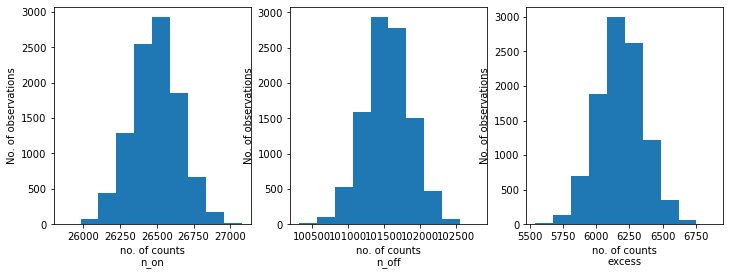

In [13]:

n_on = [dataset.counts.data.sum() for dataset in datasets]
n_off = [dataset.counts_off.data.sum() for dataset in datasets]
excess = [dataset.excess.data.sum() for dataset in datasets]

fix, axes = plt.subplots(1, 3, figsize=(12, 4))
axes[0].hist(n_on)
axes[0].set_xlabel("no. of counts\nn_on")
axes[0].set_ylabel("No. of observations")
axes[1].hist(n_off)
axes[1].set_xlabel("no. of counts\nn_off")
axes[1].set_ylabel("No. of observations")
axes[2].hist(excess)
axes[2].set_xlabel("no. of counts\nexcess");
axes[2].set_ylabel("No. of observations")

In [14]:

%%time
results = []
for dataset in datasets:
    dataset.models = model.copy()
    fit = Fit([dataset])
    result = fit.optimize()
    results.append(
        {
            "index": result.parameters["index"].value,
            "amplitude": result.parameters["amplitude"].value,
            "lambda_": result.parameters["lambda_"].value,
        }
    )

/home/rishank/anaconda2/envs/gammapy-0.12/lib/python3.6/site-packages/numpy/core/fromnumeric.py:90: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)


CPU times: user 1h 7min 59s, sys: 13.4 s, total: 1h 8min 12s
Wall time: 1h 12min 32s


In [15]:
results

[{'index': 2.169752569491976,
  'amplitude': 1.5653134721691003e-12,
  'lambda_': 5.7304570878812315},
 {'index': 2.393488523746745,
  'amplitude': 7.286175300846211e-13,
  'lambda_': 3.905504304079907},
 {'index': 2.05674633444537,
  'amplitude': 2.13609661023113e-12,
  'lambda_': 5.906316554578479},
 {'index': 2.2198891624283323,
  'amplitude': 1.2639851286831836e-12,
  'lambda_': 4.8690788872207404},
 {'index': 2.0251566902172473,
  'amplitude': 2.9214173989377874e-12,
  'lambda_': 7.501668200451735},
 {'index': 2.1591183874381765,
  'amplitude': 1.5123358711152705e-12,
  'lambda_': 5.317593059653128},
 {'index': 2.27786551050091,
  'amplitude': 1.18748129290514e-12,
  'lambda_': 5.30901410394558},
 {'index': 1.957657038806865,
  'amplitude': 2.9654928839917636e-12,
  'lambda_': 6.744542519944392},
 {'index': 2.367028293033707,
  'amplitude': 7.803183909775817e-13,
  'lambda_': 3.9453878125603405},
 {'index': 2.3072870942101904,
  'amplitude': 9.87768208600471e-13,
  'lambda_': 4.52

index: 2.209921701483993 += 0.1418820101496976


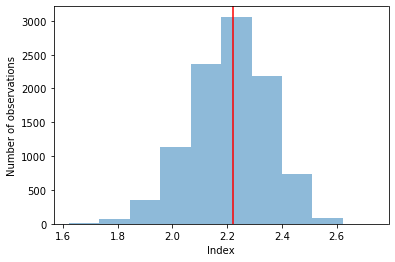

In [16]:
index = np.array([_["index"] for _ in results])
plt.hist(index, bins=10, alpha=0.5)
plt.axvline(x=model_simu.parameters["index"].value, color="red")
plt.xlabel("Index")
plt.ylabel("Number of observations")
print(f"index: {index.mean()} += {index.std()}")

amplitude: 1.4786482036969425e-12 += 7.452838196819831e-13


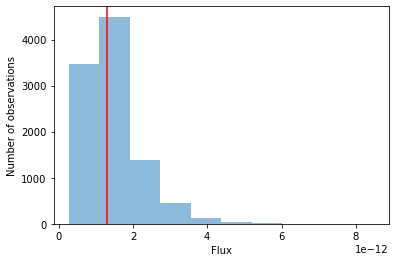

In [17]:
amplitude = np.array([_["amplitude"] for _ in results])
plt.hist(amplitude, bins=10, alpha=0.5)
plt.axvline(x=model_simu.parameters["amplitude"].value, color="red")
plt.xlabel("Flux")
plt.ylabel("Number of observations")
print(f"amplitude: {amplitude.mean()} += {amplitude.std()}")

lambda_: 5.088050059847201 += 1.0017949570317692


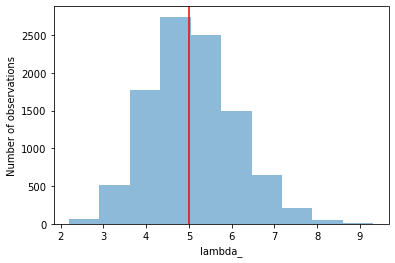

In [18]:
lambda_ = np.array([_["lambda_"] for _ in results])
plt.hist(lambda_, bins=10, alpha=0.5)
plt.axvline(x=model_simu.parameters["lambda_"].value, color="red")
plt.xlabel("lambda_")
plt.ylabel("Number of observations")
print(f"lambda_: {lambda_.mean()} += {lambda_.std()}")